# Importing libraries

In [1]:
from IPython.display import Image, display

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from wordcloud import WordCloud
import warnings
warnings.filterwarnings("ignore")
plt.style.use('bmh')

# Importing dataset

In [2]:
data=pd.read_csv('googleplaystore.csv')

# Basic Data Exploration(Understanding the Dataset)

In [3]:
data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [4]:
data.sample(5)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1153,NetSpend Prepaid,FINANCE,4.2,15993,45M,"1,000,000+",Free,0,Everyone,Finance,"May 9, 2018",4.10.0,4.4 and up
2322,1800 Contacts - Lens Store,MEDICAL,4.7,23160,26M,"1,000,000+",Free,0,Everyone,Medical,"July 27, 2018",7.4.1,5.0 and up
2142,Toy Guitar with songs for kids,FAMILY,4.3,1369,9.8M,"500,000+",Free,0,Everyone,Music & Audio;Music & Video,"March 5, 2016",1.0.3,2.3 and up
6255,Digital Tourist BH Itinerary,TRAVEL_AND_LOCAL,4.6,19,14M,500+,Free,0,Everyone,Travel & Local,"October 13, 2015",0.9.2,2.2 and up
6467,BM SPM Practice,FAMILY,5.0,6,9.2M,"1,000+",Free,0,Everyone,Education,"January 24, 2018",1.0,4.1 and up


In [5]:
data.shape

(10841, 13)

In [6]:
data.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

In [7]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
App,10841,9660,ROBLOX,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category,10841,34,FAMILY,1972,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rating,9367.0,NaN,NaN,NaN,4.193338,0.537431,1.0,4.0,4.3,4.5,19.0
Reviews,10841,6002,0,596,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Size,10841,462,Varies with device,1695,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Installs,10841,22,"1,000,000+",1579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,10840,3,Free,10039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Price,10841,93,0,10040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Content Rating,10840,6,Everyone,8714,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Genres,10841,120,Tools,842,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


* The data has 12 object and 1 numeric feature

#### We need to convert [`Reviews` & `Size`  &  `Installs` & `Price`] to int


#### We need to Change Last update into a datetime column



# Checking if all values in number of Reviews numeric


In [9]:
data[~data.Reviews.str.isnumeric()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
10472,Life Made WI-Fi Touchscreen Photo Frame,1.9,19.0,3.0M,"1,000+",Free,0,Everyone,NaN,"February 11, 2018",1.0.19,4.0 and up,NaN


In [10]:
data=data.drop(data.index[10472])

In [11]:
data["Reviews"] = data["Reviews"].astype(int)

In [12]:
data.info()  

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            10840 non-null  object 
 5   Installs        10840 non-null  object 
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), int32(1), object(11)
memory usage: 1.1+ MB


* It can be seen that data has metric prefixes (Kilo and Mega) along with another string. Replacing k and M with their values to convert values to numeric.

In [13]:
data['Size'].unique()

array(['19M', '14M', '8.7M', '25M', '2.8M', '5.6M', '29M', '33M', '3.1M',
       '28M', '12M', '20M', '21M', '37M', '2.7M', '5.5M', '17M', '39M',
       '31M', '4.2M', '7.0M', '23M', '6.0M', '6.1M', '4.6M', '9.2M',
       '5.2M', '11M', '24M', 'Varies with device', '9.4M', '15M', '10M',
       '1.2M', '26M', '8.0M', '7.9M', '56M', '57M', '35M', '54M', '201k',
       '3.6M', '5.7M', '8.6M', '2.4M', '27M', '2.5M', '16M', '3.4M',
       '8.9M', '3.9M', '2.9M', '38M', '32M', '5.4M', '18M', '1.1M',
       '2.2M', '4.5M', '9.8M', '52M', '9.0M', '6.7M', '30M', '2.6M',
       '7.1M', '3.7M', '22M', '7.4M', '6.4M', '3.2M', '8.2M', '9.9M',
       '4.9M', '9.5M', '5.0M', '5.9M', '13M', '73M', '6.8M', '3.5M',
       '4.0M', '2.3M', '7.2M', '2.1M', '42M', '7.3M', '9.1M', '55M',
       '23k', '6.5M', '1.5M', '7.5M', '51M', '41M', '48M', '8.5M', '46M',
       '8.3M', '4.3M', '4.7M', '3.3M', '40M', '7.8M', '8.8M', '6.6M',
       '5.1M', '61M', '66M', '79k', '8.4M', '118k', '44M', '695k', '1.6M',
     

* Remove all characters from size and convert it to float

In [14]:
def convert_size(size):
    if 'M' in size:
        x=size[:-1]
        x=float(x)*1000
        return(x)
    elif 'k'==size[:-1]:
        x=size[:-1]
        x=float(x)
        return(x)
    else:
        return None

In [15]:
data["Size"]=data["Size"].map(convert_size)

In [16]:
data.Size.unique()

array([ 19000.,  14000.,   8700.,  25000.,   2800.,   5600.,  29000.,
        33000.,   3100.,  28000.,  12000.,  20000.,  21000.,  37000.,
         2700.,   5500.,  17000.,  39000.,  31000.,   4200.,   7000.,
        23000.,   6000.,   6100.,   4600.,   9200.,   5200.,  11000.,
        24000.,     nan,   9400.,  15000.,  10000.,   1200.,  26000.,
         8000.,   7900.,  56000.,  57000.,  35000.,  54000.,   3600.,
         5700.,   8600.,   2400.,  27000.,   2500.,  16000.,   3400.,
         8900.,   3900.,   2900.,  38000.,  32000.,   5400.,  18000.,
         1100.,   2200.,   4500.,   9800.,  52000.,   9000.,   6700.,
        30000.,   2600.,   7100.,   3700.,  22000.,   7400.,   6400.,
         3200.,   8200.,   9900.,   4900.,   9500.,   5000.,   5900.,
        13000.,  73000.,   6800.,   3500.,   4000.,   2300.,   7200.,
         2100.,  42000.,   7300.,   9100.,  55000.,   6500.,   1500.,
         7500.,  51000.,  41000.,  48000.,   8500.,  46000.,   8300.,
         4300.,   47

In [17]:
###### Convert mega to kilo then convert all to mega
for i in data['Size']:
    if i < 10:
        data['Size']=data['Size'].replace(i,i*1000)
data['Size']=data['Size']/1000
data['Size']

0        19.0
1        14.0
2         8.7
3        25.0
4         2.8
         ... 
10836    53.0
10837     3.6
10838     9.5
10839     NaN
10840    19.0
Name: Size, Length: 10840, dtype: float64

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  object 
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(2), int32(1), object(10)
memory usage: 1.1+ MB


* Installs &  Price


In [19]:
data['Installs'].unique()

array(['10,000+', '500,000+', '5,000,000+', '50,000,000+', '100,000+',
       '50,000+', '1,000,000+', '10,000,000+', '5,000+', '100,000,000+',
       '1,000,000,000+', '1,000+', '500,000,000+', '50+', '100+', '500+',
       '10+', '1+', '5+', '0+', '0'], dtype=object)

In [20]:
data['Price'].unique()

array(['0', '$4.99', '$3.99', '$6.99', '$1.49', '$2.99', '$7.99', '$5.99',
       '$3.49', '$1.99', '$9.99', '$7.49', '$0.99', '$9.00', '$5.49',
       '$10.00', '$24.99', '$11.99', '$79.99', '$16.99', '$14.99',
       '$1.00', '$29.99', '$12.99', '$2.49', '$10.99', '$1.50', '$19.99',
       '$15.99', '$33.99', '$74.99', '$39.99', '$3.95', '$4.49', '$1.70',
       '$8.99', '$2.00', '$3.88', '$25.99', '$399.99', '$17.99',
       '$400.00', '$3.02', '$1.76', '$4.84', '$4.77', '$1.61', '$2.50',
       '$1.59', '$6.49', '$1.29', '$5.00', '$13.99', '$299.99', '$379.99',
       '$37.99', '$18.99', '$389.99', '$19.90', '$8.49', '$1.75',
       '$14.00', '$4.85', '$46.99', '$109.99', '$154.99', '$3.08',
       '$2.59', '$4.80', '$1.96', '$19.40', '$3.90', '$4.59', '$15.46',
       '$3.04', '$4.29', '$2.60', '$3.28', '$4.60', '$28.99', '$2.95',
       '$2.90', '$1.97', '$200.00', '$89.99', '$2.56', '$30.99', '$3.61',
       '$394.99', '$1.26', '$1.20', '$1.04'], dtype=object)

In [21]:
items_to_remove=['+',',','$']
cols_to_clean=['Installs','Price']
for item in items_to_remove:
    for col in cols_to_clean:
        data[col]=data[col].str.replace(item,'')
data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,5000000,Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,50000000,Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,100000,Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [22]:
data.Installs.unique()

array(['10000', '500000', '5000000', '50000000', '100000', '50000',
       '1000000', '10000000', '5000', '100000000', '1000000000', '1000',
       '500000000', '50', '100', '500', '10', '1', '5', '0'], dtype=object)

In [23]:
data['Price'].unique()

array(['0', '4.99', '3.99', '6.99', '1.49', '2.99', '7.99', '5.99',
       '3.49', '1.99', '9.99', '7.49', '0.99', '9.00', '5.49', '10.00',
       '24.99', '11.99', '79.99', '16.99', '14.99', '1.00', '29.99',
       '12.99', '2.49', '10.99', '1.50', '19.99', '15.99', '33.99',
       '74.99', '39.99', '3.95', '4.49', '1.70', '8.99', '2.00', '3.88',
       '25.99', '399.99', '17.99', '400.00', '3.02', '1.76', '4.84',
       '4.77', '1.61', '2.50', '1.59', '6.49', '1.29', '5.00', '13.99',
       '299.99', '379.99', '37.99', '18.99', '389.99', '19.90', '8.49',
       '1.75', '14.00', '4.85', '46.99', '109.99', '154.99', '3.08',
       '2.59', '4.80', '1.96', '19.40', '3.90', '4.59', '15.46', '3.04',
       '4.29', '2.60', '3.28', '4.60', '28.99', '2.95', '2.90', '1.97',
       '200.00', '89.99', '2.56', '30.99', '3.61', '394.99', '1.26',
       '1.20', '1.04'], dtype=object)

In [24]:
data['Installs']=data['Installs'].astype('int')
data['Price']=data['Price'].astype('float')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  int32  
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  float64
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(3), int32(2), object(8)
memory usage: 1.1+ MB


* last updated

In [25]:
data['Last Updated'] = pd.to_datetime(data['Last Updated'])
data['Last Updated']

0       2018-01-07
1       2018-01-15
2       2018-08-01
3       2018-06-08
4       2018-06-20
           ...    
10836   2017-07-25
10837   2018-07-06
10838   2017-01-20
10839   2015-01-19
10840   2018-07-25
Name: Last Updated, Length: 10840, dtype: datetime64[ns]

In [26]:
data['Updated_Day']=data['Last Updated'].dt.day
data['Updated_Month']=data['Last Updated'].dt.month
data['Updated_Year']=data['Last Updated'].dt.year

In [27]:
data['new'] = data['Last Updated']
data['lastupdate'] = (data['new'] - data['new'].max()).dt.days

In [28]:
data.drop(['Last Updated', 'new'] ,axis=1, inplace=True)

In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  int32  
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  float64
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Current Ver     10832 non-null  object 
 11  Android Ver     10838 non-null  object 
 12  Updated_Day     10840 non-null  int64  
 13  Updated_Month   10840 non-null  int64  
 14  Updated_Year    10840 non-null  int64  
 15  lastupdate      10840 non-null  int64  
dtypes: float64(3), int32(2), int64(4), object(7)
memory usage: 1.3+ MB


# Data Cleaning

## Checking for null values


In [30]:
Null_data = data.isna().sum().sort_values(ascending=False)
null = pd.DataFrame(
    {'Null Values' : Null_data
     ,'Percentage Null Values' : Null_data / (data.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
Size,2011,18.551661
Rating,1474,13.597786
Current Ver,8,0.073801
Android Ver,2,0.018450
Type,1,0.009225
App,0,0.000000
Category,0,0.000000
Reviews,0,0.000000
Installs,0,0.000000
Price,0,0.000000


<BarContainer object of 16 artists>

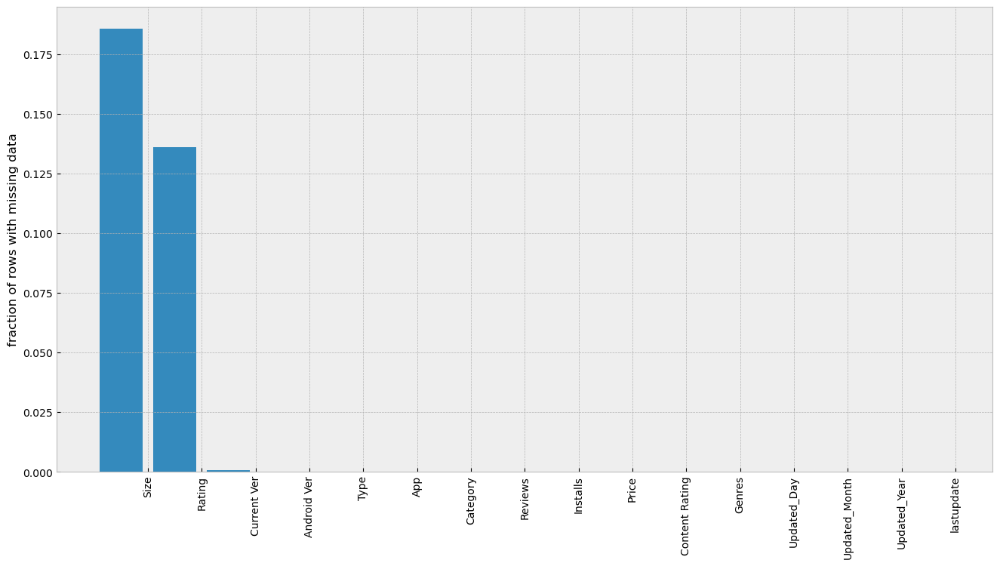

In [31]:
null_counts = Null_data /len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts))+0.5,
           null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

In [32]:
### lets create a function so that I can easily do it for all features
def Random_value_imputation(feature):
    random_sample=data[feature].dropna().sample(data[feature].isnull().sum())               
    random_sample.index=data[data[feature].isnull()].index
    data.loc[data[feature].isnull(),feature]=random_sample

In [33]:
for col in data:
    Random_value_imputation(col)

In [34]:
Null_data = data.isna().sum().sort_values(ascending=False)
null = pd.DataFrame(
    {'Null Values' : Null_data
     ,'Percentage Null Values' : Null_data / (data.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
App,0,0.0
Category,0,0.0
Rating,0,0.0
Reviews,0,0.0
Size,0,0.0
Installs,0,0.0
Type,0,0.0
Price,0,0.0
Content Rating,0,0.0
Genres,0,0.0


<BarContainer object of 16 artists>

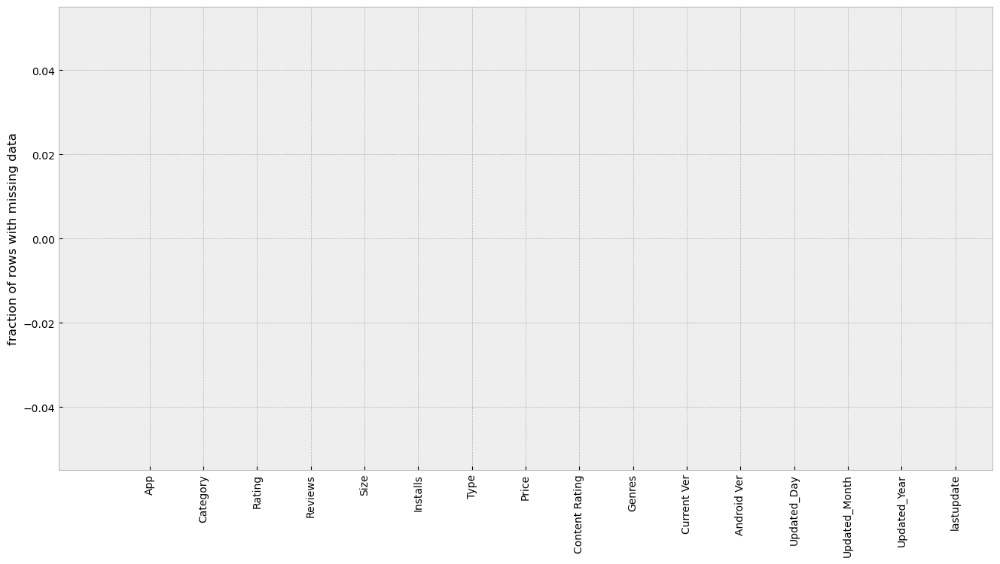

In [35]:
null_counts = Null_data /len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts))+0.5,
           null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

## Delete data duplicated

In [36]:
duplicate = data.duplicated()
print(duplicate.sum())

307


In [37]:
data.drop_duplicates(inplace=True)

In [38]:
duplicate = data.duplicated()
print(duplicate.sum())

0


## Extract Numerical & Categorical Features

In [39]:
num_features=[col for col in data.columns if data[col].dtype!='O']
num_features

['Rating',
 'Reviews',
 'Size',
 'Installs',
 'Price',
 'Updated_Day',
 'Updated_Month',
 'Updated_Year',
 'lastupdate']

In [40]:
num_data = data[num_features]
num_data.head()

,Rating,Reviews,Size,Installs,Price,Updated_Day,Updated_Month,Updated_Year,lastupdate
0,4.1,159,19.0,10000,0.0,7,1,2018,-213
1,3.9,967,14.0,500000,0.0,15,1,2018,-205
2,4.7,87510,8.7,5000000,0.0,1,8,2018,-7
3,4.5,215644,25.0,50000000,0.0,8,6,2018,-61
4,4.3,967,2.8,100000,0.0,20,6,2018,-49


In [41]:
cat_features=[col for col in data.columns if data[col].dtype=='O']
cat_features

['App',
 'Category',
 'Type',
 'Content Rating',
 'Genres',
 'Current Ver',
 'Android Ver']

In [42]:
categorical=data[cat_features]
categorical.head()

,App,Category,Type,Content Rating,Genres,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,Free,Everyone,Art & Design,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,Free,Everyone,Art & Design;Pretend Play,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,Free,Everyone,Art & Design,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,Free,Teen,Art & Design,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,Free,Everyone,Art & Design;Creativity,1.1,4.4 and up


## Check outliers

In [43]:
def outlier_thresholds(dataframe, variable):
    quartile1 = dataframe[variable].quantile(0.10)
    quartile3 = dataframe[variable].quantile(0.90)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [44]:
def has_outliers(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    if dataframe[(dataframe[variable] < low_limit) | (dataframe[variable] > up_limit)].any(axis=None):
        print(variable, "yes")
    else:
        print(variable, "no")

In [45]:
for col in num_data.columns:
    has_outliers(num_data, col)

Rating yes
Reviews yes
Size no
Installs yes
Price yes
Updated_Day no
Updated_Month no
Updated_Year yes
lastupdate yes


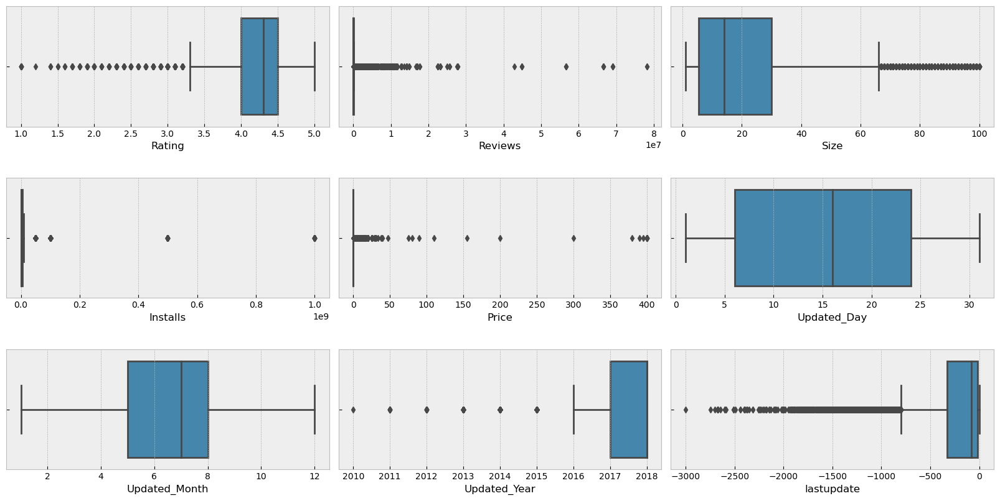

In [46]:
fig, axs = plt.subplots(ncols=3, nrows=3, figsize=(16, 8))
index = 0
axs = axs.flatten()
for i,col in enumerate(num_data.columns):
    sns.boxplot(x = num_data[col], ax = axs[i])
plt.tight_layout(pad= 0.5, w_pad=0.5, h_pad=3.0)

In [47]:
## function to get ride of qutliers
def replace_with_thresholds(dataframe, numeric_columns):
    for variable in numeric_columns:
        low_limit, up_limit = outlier_thresholds(dataframe, variable)
        dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
        dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [48]:
replace_with_thresholds(num_data, num_data.columns)

In [49]:
for col in num_data.columns:
    has_outliers(num_data, col)

Rating no
Reviews no
Size no
Installs no
Price no
Updated_Day no
Updated_Month no
Updated_Year no
lastupdate no


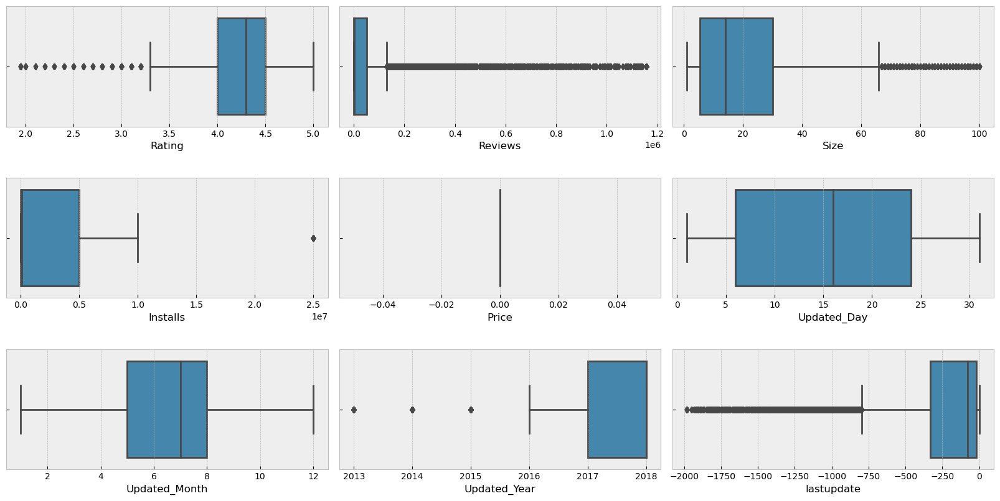

In [50]:
fig, axs = plt.subplots(ncols=3, nrows=3, figsize=(16, 8))
index = 0
axs = axs.flatten()
for i,col in enumerate(num_data.columns):
    sns.boxplot(x = num_data[col], ax = axs[i])
plt.tight_layout(pad= 0.5, w_pad=0.5, h_pad=3.0)

In [51]:
for col in data[num_features]:
    has_outliers(data, col)

Rating yes
Reviews yes
Size no
Installs yes
Price yes
Updated_Day no
Updated_Month no
Updated_Year yes
lastupdate yes


In [52]:
data_clean = data.copy()

In [53]:
replace_with_thresholds(data_clean, num_features)

In [54]:
for col in data_clean[num_features]:
    has_outliers(data_clean, col)

Rating no
Reviews no
Size no
Installs no
Price no
Updated_Day no
Updated_Month no
Updated_Year no
lastupdate no


# Exploratory Data Analysis (EDA)

## App Column

In [55]:
data.sort_values(by=['Rating', 'Reviews', 'Installs'], ascending=[False, False, False]).head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Current Ver,Android Ver,Updated_Day,Updated_Month,Updated_Year,lastupdate
10357,Ríos de Fe,LIFESTYLE,5.0,141,15.0,1000,Free,0.0,Everyone,Lifestyle,1.8,4.1 and up,24,3,2018,-137
10301,"FD Calculator (EMI, SIP, RD & Loan Eligilibility)",FINANCE,5.0,104,2.3,1000,Free,0.0,Everyone,Finance,2.1.0,4.1 and up,7,8,2018,-1
8058,Oración CX,LIFESTYLE,5.0,103,3.8,5000,Free,0.0,Everyone,Lifestyle,5.1.10,4.1 and up,12,9,2017,-330
6823,Barisal University App-BU Face,FAMILY,5.0,100,10.0,1000,Free,0.0,Everyone,Education,3.1.1,4.0.3 and up,6,5,2018,-94
9496,Master E.K,FAMILY,5.0,90,1.8,1000,Free,0.0,Everyone,Education,1.5.0,4.4 and up,11,8,2017,-362


In [56]:
data.sort_values('Size', ascending=False).head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Current Ver,Android Ver,Updated_Day,Updated_Month,Updated_Year,lastupdate
2299,Navi Radiography Pro,MEDICAL,4.7,11,100.0,500,Paid,15.99,Everyone,Medical,1.2.0,4.0.3 and up,14,1,2018,-206
1988,Hungry Shark Evolution,GAME,4.5,6074627,100.0,100000000,Free,0.00,Teen,Arcade,6.0.0,4.1 and up,25,7,2018,-14
1565,Talking Babsy Baby: Baby Games,LIFESTYLE,4.0,140995,100.0,10000000,Free,0.00,Everyone,Lifestyle;Pretend Play,9.0,4.0 and up,16,7,2018,-23
7404,SimCity BuildIt,FAMILY,4.5,4218587,100.0,50000000,Free,0.00,Everyone 10+,Simulation,1.23.3.75024,4.0 and up,19,6,2018,-50
3973,Hungry Shark Evolution,GAME,4.5,6071542,100.0,100000000,Free,0.00,Teen,Arcade,6.0.0,4.1 and up,25,7,2018,-14


In [57]:
data.groupby('App')['Reviews'].max().sort_values(ascending=False).head(30)

App
Facebook                                              78158306
WhatsApp Messenger                                    69119316
Instagram                                             66577446
Messenger – Text and Video Chat for Free              56646578
Clash of Clans                                        44893888
Clean Master- Space Cleaner & Antivirus               42916526
Subway Surfers                                        27725352
YouTube                                               25655305
Security Master - Antivirus, VPN, AppLock, Booster    24900999
Clash Royale                                          23136735
Candy Crush Saga                                      22430188
UC Browser - Fast Download Private & Secure           17714850
Snapchat                                              17015352
360 Security - Free Antivirus, Booster, Cleaner       16771865
My Talking Tom                                        14892469
8 Ball Pool                                        

## Category Column

In [58]:
categorical['Category'].value_counts()

FAMILY                 1946
GAME                   1129
TOOLS                   843
BUSINESS                439
PRODUCTIVITY            420
MEDICAL                 415
PERSONALIZATION         391
COMMUNICATION           381
LIFESTYLE               375
SPORTS                  369
FINANCE                 363
PHOTOGRAPHY             324
HEALTH_AND_FITNESS      317
SOCIAL                  288
NEWS_AND_MAGAZINES      276
TRAVEL_AND_LOCAL        245
SHOPPING                240
BOOKS_AND_REFERENCE     230
DATING                  202
VIDEO_PLAYERS           175
EDUCATION               141
MAPS_AND_NAVIGATION     137
ENTERTAINMENT           126
FOOD_AND_DRINK          125
AUTO_AND_VEHICLES        85
LIBRARIES_AND_DEMO       85
HOUSE_AND_HOME           82
WEATHER                  82
ART_AND_DESIGN           65
EVENTS                   64
PARENTING                60
COMICS                   60
BEAUTY                   53
Name: Category, dtype: int64

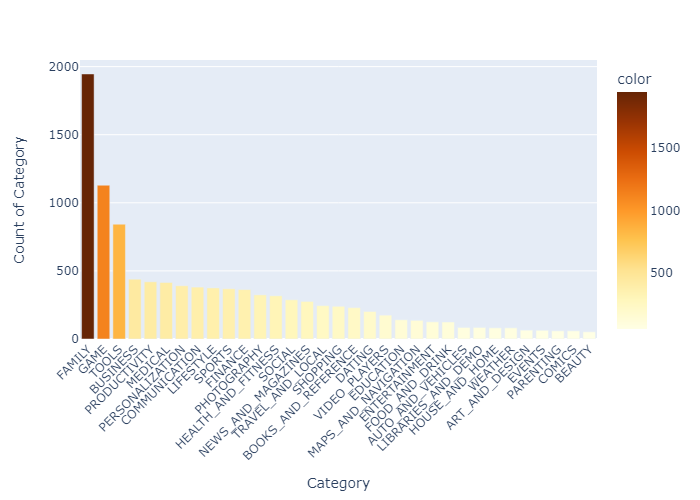

In [59]:
bar = px.bar(
        x = categorical['Category'].value_counts().index, # index = category name
        y = categorical['Category'].value_counts().values,
        color=categorical['Category'].value_counts().values,
        color_continuous_scale='YlOrBr'
)
bar.update_layout(xaxis_title='Category', yaxis_title='Count of Category')
bar.update_xaxes(tickangle= -45)
bar.show()
bar.write_image("Count of Category.png")
display(Image(filename='Count of Category.png'))

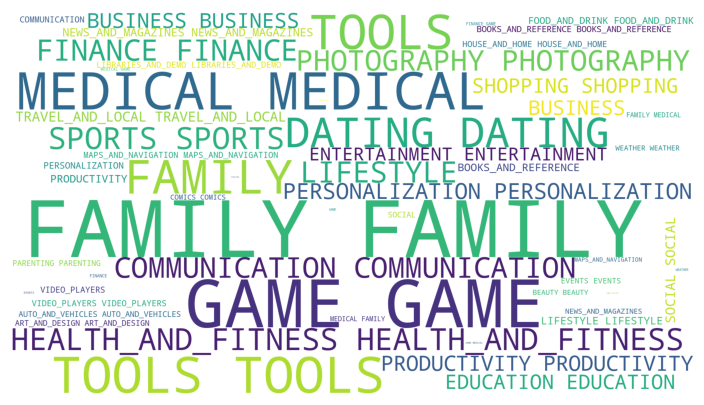

In [60]:
plt.subplots(figsize=(10,5))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(data.Category))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [61]:
# Group apps by category and then sum the number of installations
category_installs = data.groupby('Category').agg({'Installs': pd.Series.sum})
category_installs.sort_values('Installs', ascending=True, inplace=True)
category_installs

,Installs
Category,
EVENTS,15973161
BEAUTY,27197050
PARENTING,31521110
MEDICAL,42229487
AUTO_AND_VEHICLES,53130211
COMICS,56086150
LIBRARIES_AND_DEMO,62995910
ART_AND_DESIGN,124338100
HOUSE_AND_HOME,145212461


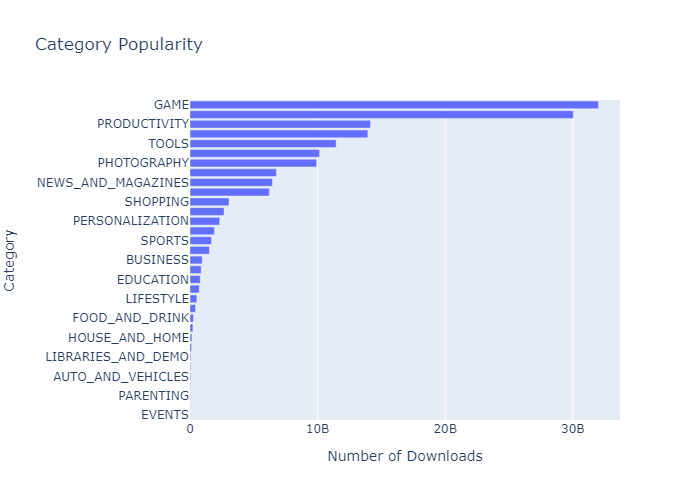

In [62]:
h_bar = px.bar(
        x = category_installs.Installs,
        y = category_installs.index,
        orientation='h',
        title='Category Popularity')

h_bar.update_layout(xaxis_title='Number of Downloads', yaxis_title='Category')
h_bar.show()

h_bar.write_image("Category_Popularity.png")
display(Image(filename='Category_Popularity.png'))

In [63]:
# Count the number of apps in each category
cat_number = data.groupby('Category').agg({'App': pd.Series.count})
cat_merged_df = pd.merge(cat_number, category_installs, on='Category', how="inner")
print(f'The dimensions of the DataFrame are: {cat_merged_df.shape}')
cat_merged_df.sort_values('Installs', ascending=False)

The dimensions of the DataFrame are: (33, 2)


,App,Installs
Category,,
GAME,1129,32014024415
COMMUNICATION,381,30042276251
PRODUCTIVITY,420,14145091369
SOCIAL,288,13938867902
TOOLS,843,11452771915
FAMILY,1946,10156692505
PHOTOGRAPHY,324,9921247655
TRAVEL_AND_LOCAL,245,6772887146
NEWS_AND_MAGAZINES,276,6459317760


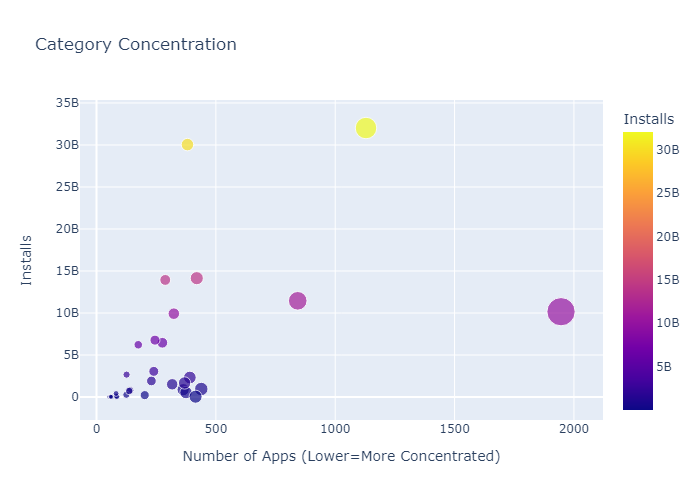

In [64]:
scatter = px.scatter(cat_merged_df, # data
                     x='App', # column name
                     y='Installs',
                     title='Category Concentration',
                     size='App',
                     hover_name=cat_merged_df.index,
                     color='Installs') 

scatter.update_layout(xaxis_title="Number of Apps (Lower=More Concentrated)",
                      yaxis_title="Installs",
                      #yaxis=dict(type='log')
                     )

scatter.show()

scatter.write_image("Category_Concentration_1.png")
display(Image(filename='Category_Concentration_1.png'))

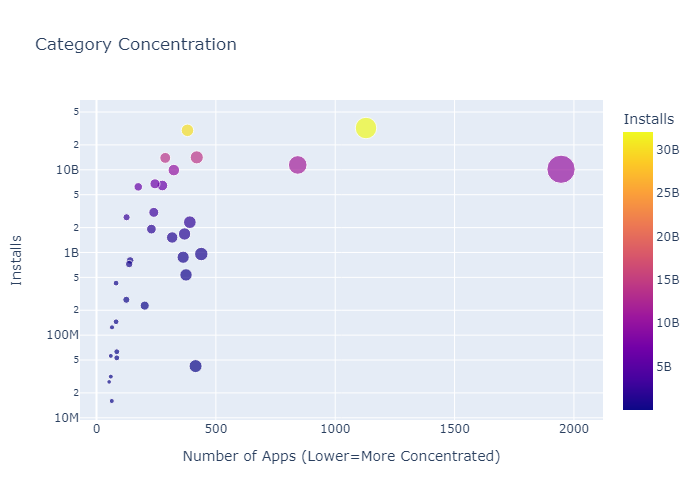

In [65]:
scatter = px.scatter(cat_merged_df, # data
                     x='App', # column name
                     y='Installs',
                     title='Category Concentration',
                     size='App',
                     hover_name=cat_merged_df.index,
                     color='Installs'
) 

scatter.update_layout(xaxis_title="Number of Apps (Lower=More Concentrated)",
                      yaxis_title="Installs",
                      yaxis=dict(type='log'))

scatter.show()

scatter.write_image("Category_Concentration_2.png")
display(Image(filename='Category_Concentration_2.png'))

In [66]:
df_free_vs_paid = data.groupby(["Category", "Type"], 
                                      as_index=False).agg({'App': pd.Series.count})
df_free_vs_paid.sort_values('App')

,Category,Type,App
19,EVENTS,Paid,1
32,LIBRARIES_AND_DEMO,Paid,1
25,FOOD_AND_DRINK,Paid,2
40,NEWS_AND_MAGAZINES,Paid,2
42,PARENTING,Paid,2
...,...,...,...
47,PRODUCTIVITY,Free,392
7,BUSINESS,Free,427
55,TOOLS,Free,765
26,GAME,Free,1046


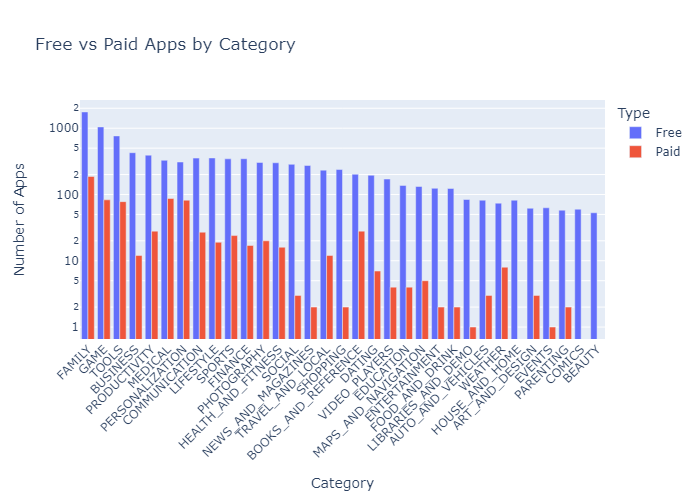

In [67]:
g_bar = px.bar(df_free_vs_paid, 
               x='Category', 
               y='App',
               title='Free vs Paid Apps by Category',
               color='Type', 
               barmode='group',)

g_bar.update_layout(xaxis_title='Category',
                    yaxis_title='Number of Apps',
                    xaxis={'categoryorder':'total descending'},
                    xaxis_tickangle=-45,
                    yaxis=dict(type='log'),
                    )

g_bar.show()

g_bar.write_image("Free_vs_Paid_Apps_by_Category.png")
display(Image(filename='Free_vs_Paid_Apps_by_Category.png'))

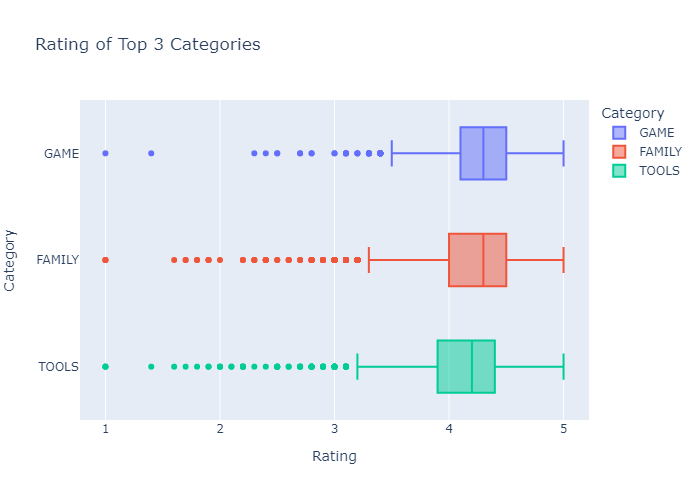

In [68]:
categories = ['FAMILY', 'GAME', 'TOOLS']
filtered_data = data[data['Category'].isin(categories)]

# Tạo biểu đồ hộp sử dụng Plotly Express
fig = px.box(filtered_data, y ='Category', x ='Rating',
             color='Category', title='Rating of Top 3 Categories')

# Hiển thị biểu đồ
fig.show()

# Lưu biểu đồ thành hình ảnh PNG
fig.write_image("Rating of Top 3 Categories.png")
display(Image(filename='Rating of Top 3 Categories.png'))

### Category vs Rating Analysis

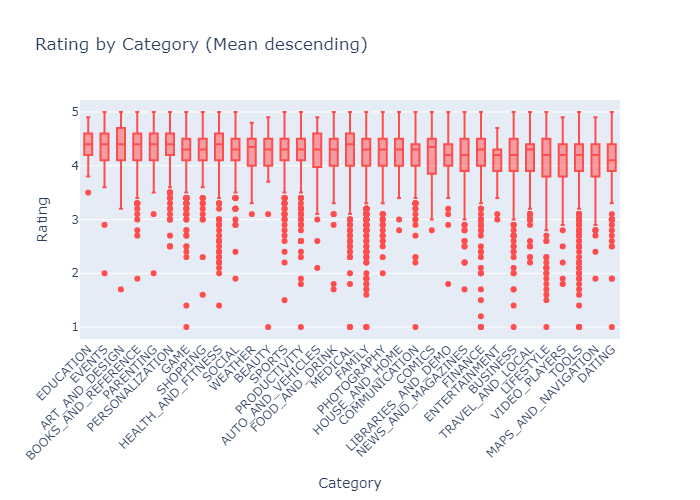

In [69]:
box = px.box(data, x="Category", y="Rating", title="Rating by Category (Mean descending)"
             ,color_discrete_sequence=['#ff4d4d'])
box.update_layout(xaxis_title='Category',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'mean descending'},
                  xaxis_tickangle=-45,
                  #yaxis=dict(type='log')
                 showlegend=False)

box.show()

box.write_image("Rating by Category (Mean descending).png")
display(Image(filename='Rating by Category (Mean descending).png'))

### Type Column

In [70]:
categorical['Type'].value_counts()

Free    9764
Paid     769
Name: Type, dtype: int64

(array([0, 1]), [Text(0, 0, 'Free'), Text(1, 0, 'Paid')])

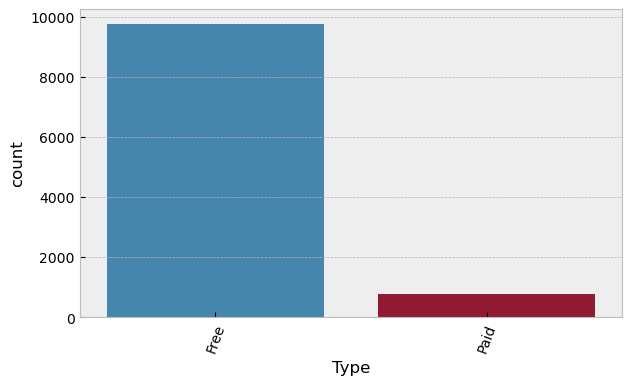

In [71]:
plt.rcParams['figure.figsize'] = (7,4)
sns.countplot(x='Type',data=data)
plt.xticks(rotation=70)

<Axes: ylabel='Type'>

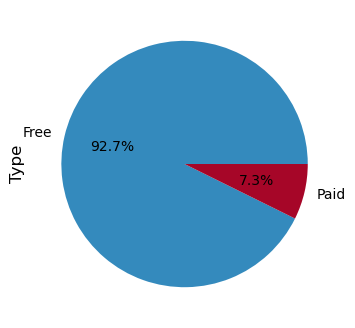

In [72]:
data["Type"].value_counts().plot.pie(autopct = "%1.1f%%")

### Type vs Rating

<Figure size 1500x800 with 0 Axes>

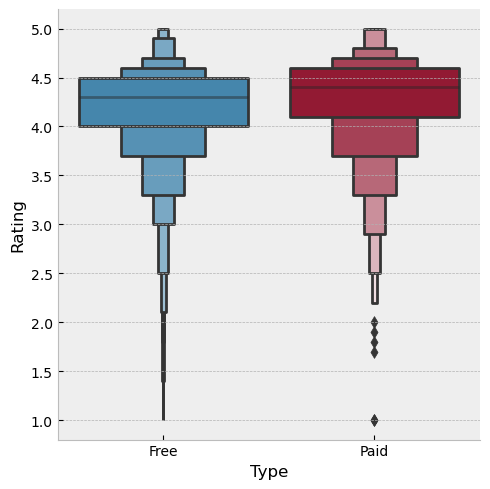

In [73]:
plt.figure(figsize=(15,8))
sns.catplot(y='Rating',x='Type',data = data.sort_values('Rating',ascending=False),kind='boxen')

## Revenue by Paid App Category

In [74]:
data_paid_apps = data[data['Type'] == 'Paid']

In [75]:
data_paid_apps['Revenue_Estimate'] = data_paid_apps.Installs.mul(data.Price)
data_paid_apps.sort_values('Revenue_Estimate', ascending=False)[:10]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Current Ver,Android Ver,Updated_Day,Updated_Month,Updated_Year,lastupdate,Revenue_Estimate
4347,Minecraft,FAMILY,4.5,2375336,2.8,10000000,Paid,6.99,Everyone 10+,Arcade;Action & Adventure,1.5.2.1,Varies with device,24,7,2018,-15,69900000.0
2241,Minecraft,FAMILY,4.5,2376564,33.0,10000000,Paid,6.99,Everyone 10+,Arcade;Action & Adventure,1.5.2.1,Varies with device,24,7,2018,-15,69900000.0
5351,I am rich,LIFESTYLE,3.8,3547,1.8,100000,Paid,399.99,Everyone,Lifestyle,2.0,4.0.3 and up,12,1,2018,-208,39999000.0
5356,I Am Rich Premium,FINANCE,4.1,1867,4.7,50000,Paid,399.99,Everyone,Finance,1.6,4.0 and up,12,11,2017,-269,19999500.0
4034,Hitman Sniper,GAME,4.6,408292,29.0,10000000,Paid,0.99,Mature 17+,Action,1.7.110758,4.1 and up,12,7,2018,-27,9900000.0
7417,Grand Theft Auto: San Andreas,GAME,4.4,348962,26.0,1000000,Paid,6.99,Mature 17+,Action,1.08,3.0 and up,21,3,2015,-1236,6990000.0
2883,Facetune - For Free,PHOTOGRAPHY,4.4,49553,48.0,1000000,Paid,5.99,Everyone,Photography,1.3.1,4.1 and up,25,7,2018,-14,5990000.0
5578,Sleep as Android Unlock,LIFESTYLE,4.5,23966,14.0,1000000,Paid,5.99,Everyone,Lifestyle,20180608,4.0 and up,27,6,2018,-42,5990000.0
8804,DraStic DS Emulator,GAME,4.6,87766,12.0,1000000,Paid,4.99,Everyone,Action,r2.5.0.3a,2.3 and up,19,7,2016,-750,4990000.0
4367,I'm Rich - Trump Edition,LIFESTYLE,3.6,275,7.3,10000,Paid,400.00,Everyone,Lifestyle,1.0.1,4.1 and up,3,5,2018,-97,4000000.0


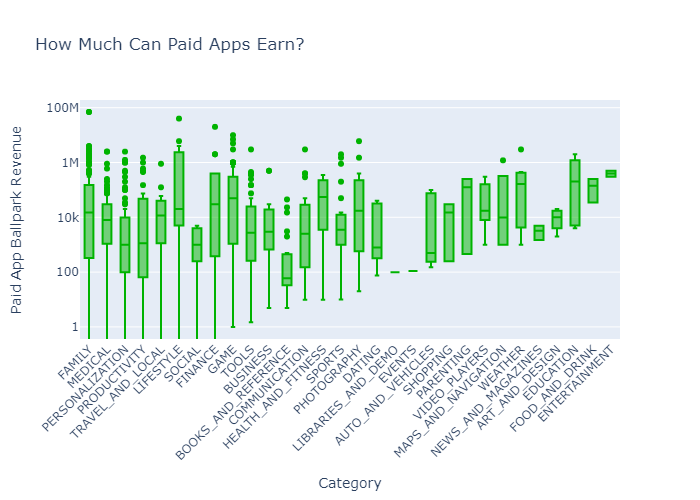

In [76]:
box = px.box(data_paid_apps, 
             x='Category', 
             y='Revenue_Estimate',
             title='How Much Can Paid Apps Earn?',
             color_discrete_sequence=['#00b300'])

box.update_layout(xaxis_title='Category',
                  yaxis_title='Paid App Ballpark Revenue',
                  xaxis={'categoryorder':'min ascending'},
                  xaxis_tickangle=-45,
                  yaxis=dict(type='log'))


box.show()

box.write_image("How_Much_Can_Paid_Apps_Earn.png")
display(Image(filename='How_Much_Can_Paid_Apps_Earn.png'))


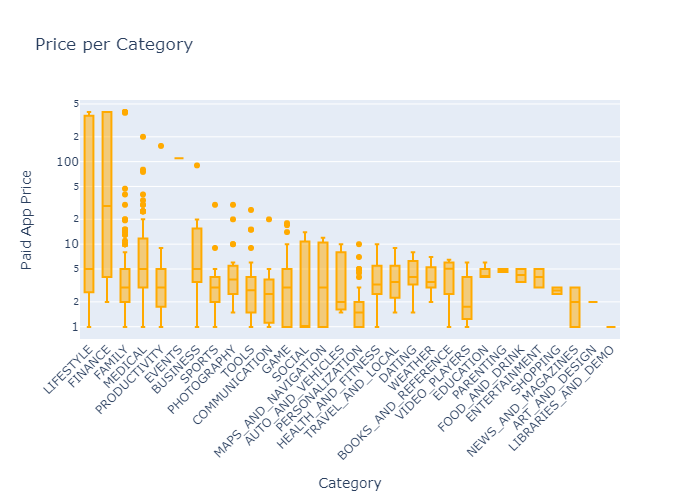

In [77]:
box = px.box(data_paid_apps, 
             x='Category', 
             y="Price",
             title='Price per Category',
             color_discrete_sequence=['#ffaa00'])

box.update_layout(xaxis_title='Category',
                  yaxis_title='Paid App Price',
                  xaxis={'categoryorder':'max descending'},
                  xaxis_tickangle=-45,
                  yaxis=dict(type='log'))


box.show()

box.write_image("Price_per_Category.png")
display(Image(filename='Price_per_Category.png'))


### Content Rating Column

In [78]:
content_ratings= categorical['Content Rating'].value_counts()

In [79]:
content_ratings


Everyone           8498
Teen               1172
Mature 17+          463
Everyone 10+        395
Adults only 18+       3
Unrated               2
Name: Content Rating, dtype: int64

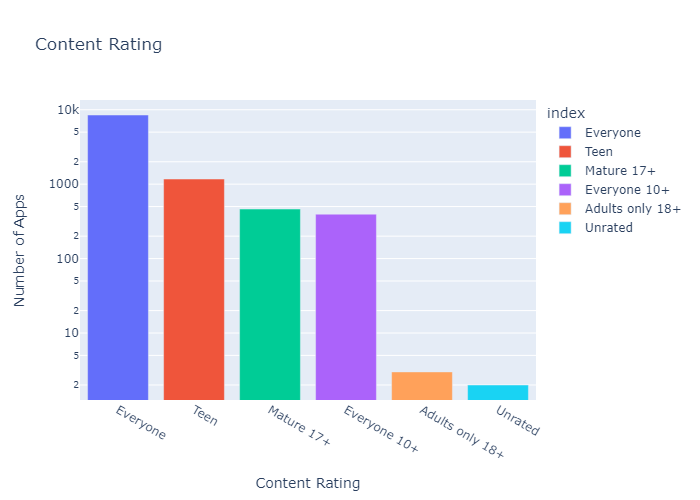

In [80]:
fig = px.bar(content_ratings,
             x=content_ratings.index,
             y=content_ratings.values,
             color = content_ratings.index,
             title="Content Rating")
fig.update_layout(xaxis_title='Content Rating',
                    yaxis_title='Number of Apps',
                    xaxis={'categoryorder':'total descending'},
                    yaxis=dict(type='log'),
                    )

fig.show()


fig.write_image("Content Rating.png")
display(Image(filename='Content Rating.png'))

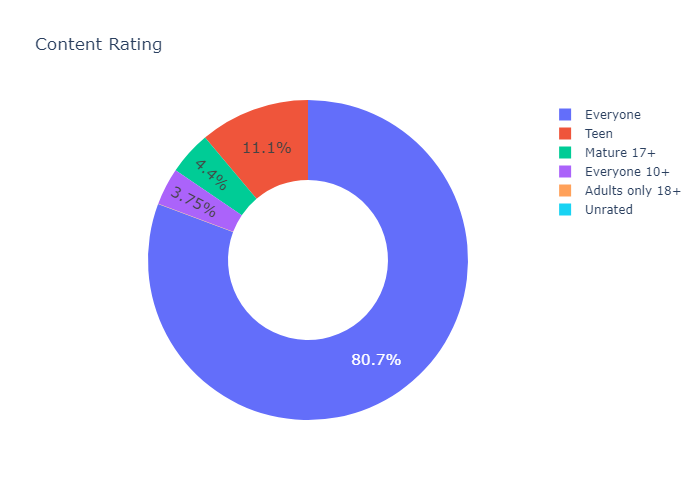

In [81]:
fig = px.pie(labels=content_ratings.index.to_numpy(), 
             values=content_ratings.values,
             title="Content Rating",
             names=content_ratings.index,
             hole=0.5, # makes a donut chart =) 
)
fig.update_traces(textposition='inside', textfont_size=15, textinfo='percent')

fig.show()

fig.write_image("Pie_chart_Content_Rating.png")
display(Image(filename='Pie_chart_Content_Rating.png'))

### Content Rating vs Rating Analysis

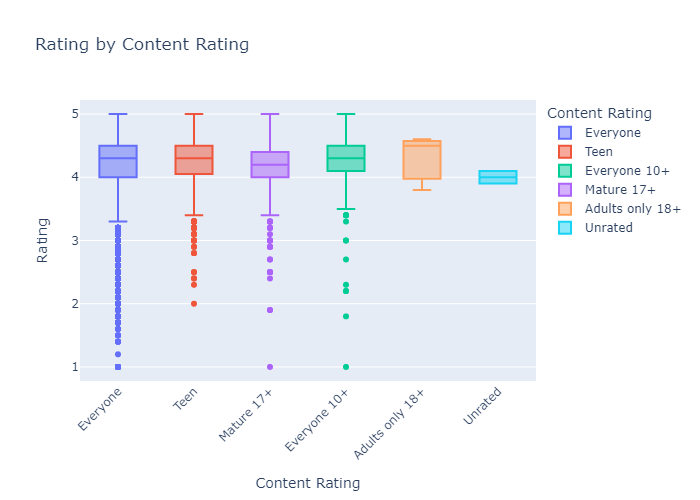

In [82]:
box = px.box(data, x="Content Rating", y="Rating", title="Rating by Content Rating",
             color="Content Rating")
box.update_layout(xaxis_title='Content Rating',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45)

box.show()

box.write_image("Rating_by_Content_Rating.png")
display(Image(filename='Rating_by_Content_Rating.png'))

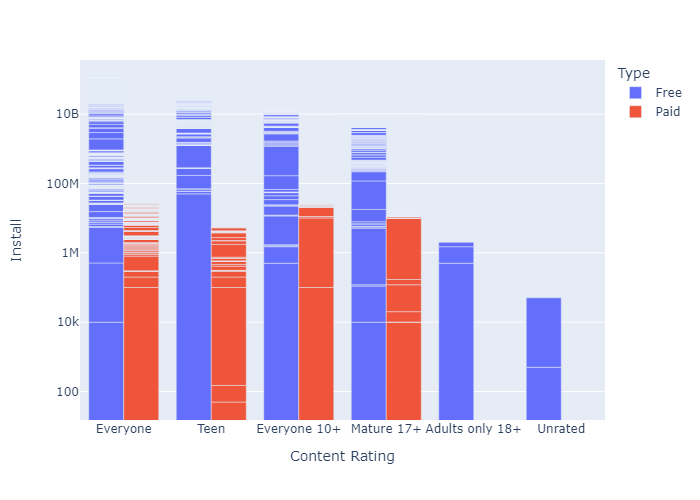

In [83]:
fig = px.bar(data, x='Content Rating'
       , y='Installs',color='Type', barmode='group',)
fig.update_layout(xaxis_title='Content Rating',
                    yaxis_title='Install',
                    xaxis={'categoryorder':'total descending'},
                    yaxis=dict(type='log'),
                    )
fig.show()

fig.write_image("Install_of_Content_Rating_by_Type.png")
display(Image(filename='Install_of_Content_Rating_by_Type.png'))

### Genres Column

In [84]:
categorical['Genres'].value_counts()

Tools                                842
Entertainment                        603
Education                            536
Business                             439
Productivity                         420
                                    ... 
Parenting;Brain Games                  1
Travel & Local;Action & Adventure      1
Lifestyle;Pretend Play                 1
Tools;Education                        1
Strategy;Creativity                    1
Name: Genres, Length: 119, dtype: int64

In [85]:
# Split the strings on the semi-colon and then .stack them. 
stack = categorical.Genres.str.split(';', expand=True).stack()
print(f'We now have a single column with shape: {stack.shape}')
num_genres = stack.value_counts()
print(f'Number of genres: {len(num_genres)}')
print(num_genres)

We now have a single column with shape: (11000,)
Number of genres: 53
Tools                      843
Education                  730
Entertainment              644
Business                   439
Productivity               420
Medical                    415
Personalization            391
Sports                     386
Communication              382
Lifestyle                  376
Action                     376
Finance                    363
Photography                324
Health & Fitness           319
Social                     288
News & Magazines           276
Casual                     264
Travel & Local             245
Shopping                   240
Arcade                     235
Books & Reference          233
Simulation                 216
Dating                     202
Video Players & Editors    178
Puzzle                     163
Maps & Navigation          137
Action & Adventure         130
Food & Drink               125
Role Playing               121
Racing                     119


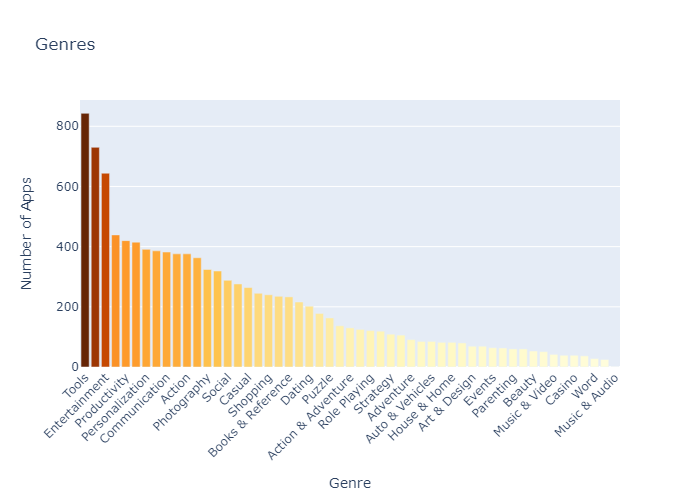

In [86]:
bar = px.bar(
        x = num_genres.index, 
        y = num_genres.values,
        title='Genres',
        hover_name=num_genres.index,
        color=num_genres.values,
        color_continuous_scale='YlOrBr')

bar.update_layout(xaxis_title='Genre',
                  yaxis_title='Number of Apps',
                  xaxis_tickangle=-45,
                  coloraxis_showscale=False)

bar.show()


bar.write_image("Genres.png")
display(Image(filename='Genres.png'))


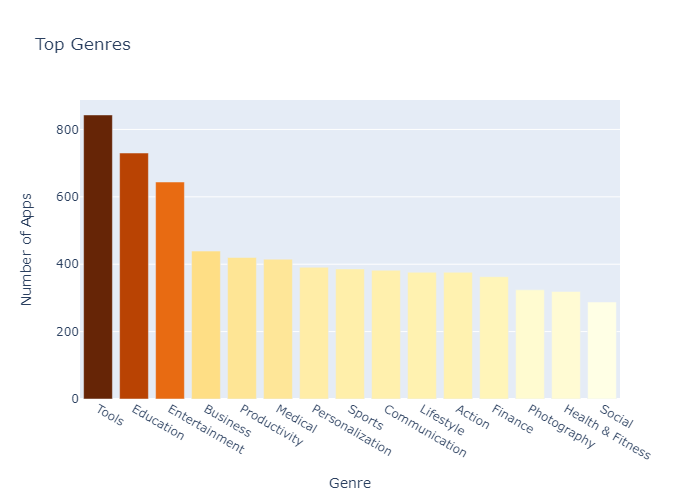

In [87]:
bar = px.bar(
        x = num_genres.index[:15], 
        y = num_genres.values[:15],
        title='Top Genres',
        hover_name=num_genres.index[:15],
        color=num_genres.values[:15],
        color_continuous_scale='YlOrBr')

bar.update_layout(xaxis_title='Genre',
                  yaxis_title='Number of Apps',
                  coloraxis_showscale=False)

bar.show()

bar.write_image("Top_Genres.png")
display(Image(filename='Top_Genres.png'))

### Rating vs Genres Analysis

In [88]:
top_15_genres = num_genres.head(15).index
Top_Genres = data[data.Genres.isin(top_15_genres)]
Num_genres = data[data.Genres.isin(num_genres.index)]

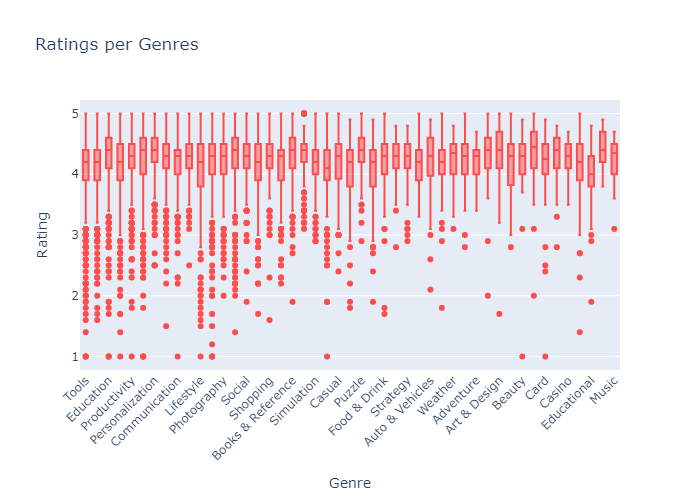

In [89]:
box = px.box(Num_genres, 
             x='Genres', 
             y='Rating',
             title='Ratings per Genres',
            color_discrete_sequence=['#ff4d4d'])

box.update_layout(xaxis_title='Genre',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45,
                  showlegend=False)


box.show()

box.write_image("Ratings per Genres.png")
display(Image(filename='Ratings per Genres.png'))


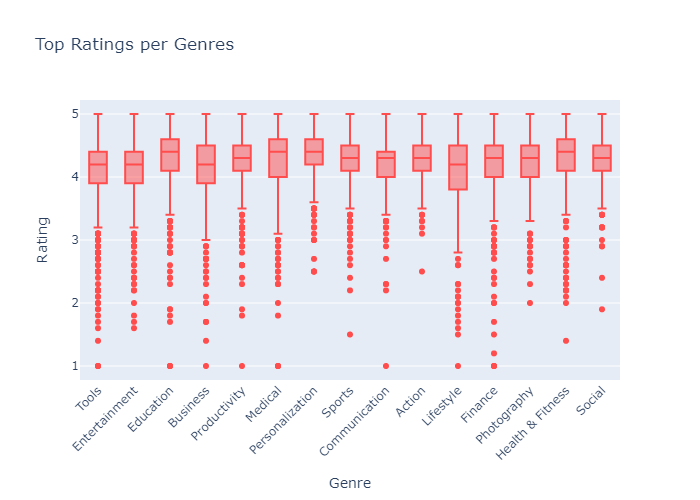

In [90]:
box = px.box(Top_Genres, 
             x='Genres', 
             y='Rating',
             title='Top Ratings per Genres',
            color_discrete_sequence=['#ff4d4d'])

box.update_layout(xaxis_title='Genre',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45,
                  showlegend=False)


box.show()

box.write_image("Top_Ratings per Genres.png")
display(Image(filename='Top_Ratings per Genres.png'))


### Current Ver Column

In [91]:
categorical['Current Ver'].value_counts()

Varies with device    1454
1.0                    802
1.1                    260
1.2                    178
2.0                    149
                      ... 
12.2.7.3671              1
8.50.935520              1
1.8.4.5                  1
2.9.10                   1
2.0.148.0                1
Name: Current Ver, Length: 2831, dtype: int64

### Android Ver Column

In [92]:
categorical['Android Ver'].value_counts()

4.1 and up            2385
4.0.3 and up          1458
Varies with device    1358
4.0 and up            1341
4.4 and up             905
2.3 and up             644
5.0 and up             557
4.2 and up             387
2.3.3 and up           279
2.2 and up             240
3.0 and up             237
4.3 and up             235
2.1 and up             133
1.6 and up             116
6.0 and up              58
7.0 and up              42
3.2 and up              36
2.0 and up              32
5.1 and up              22
1.5 and up              20
4.4W and up             11
3.1 and up              10
2.0.1 and up             7
8.0 and up               6
7.1 and up               3
4.0.3 - 7.1.1            2
5.0 - 8.0                2
1.0 and up               2
7.0 - 7.1.1              1
4.1 - 7.1.1              1
5.0 - 6.0                1
2.2 - 7.1.1              1
5.0 - 7.1.1              1
Name: Android Ver, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, '4.0.3 and up'),
  Text(1, 0, '4.2 and up'),
  Text(2, 0, '4.4 and up'),
  Text(3, 0, '2.3 and up'),
  Text(4, 0, '3.0 and up'),
  Text(5, 0, '4.1 and up'),
  Text(6, 0, '4.0 and up'),
  Text(7, 0, '2.3.3 and up'),
  Text(8, 0, 'Varies with device'),
  Text(9, 0, '2.2 and up'),
  Text(10, 0, '5.0 and up'),
  Text(11, 0, '6.0 and up'),
  Text(12, 0, '1.6 and up'),
  Text(13, 0, '1.5 and up'),
  Text(14, 0, '2.1 and up'),
  Text(15, 0, '7.0 and up'),
  Text(16, 0, '5.1 and up'),
  Text(17, 0, '4.3 and up'),
  Text(18, 0, '4.0.3 - 7.1.1'),
  Text(19, 0, '2.0 and up'),
  Text(20, 0, '3.2 and up'),
  Text(21, 0, '4.4W and up'),
  Text(22, 0, '7.1 and up'),
  Text(23, 0, '7.0 - 7.1.1'),
  Text(24, 0, '8.0 and up'),
  Text(25, 0, '5.0 - 8.0'),
  Text(26, 0, '3.1 and up'),
  Text(27, 0, '2.0.1 and up'),
  Text(28, 0, '4.1 - 7.1.1'),


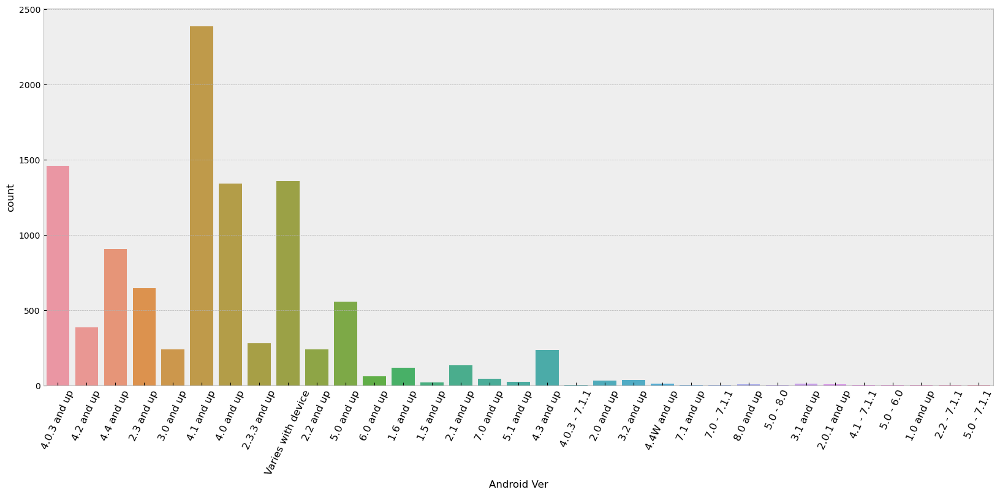

In [93]:
plt.figure(figsize=(20,8))
sns.countplot(x='Android Ver',data=data)
plt.xticks(rotation=65)
plt.xticks(fontsize=12)

### Rating vs Android Ver Analysis

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, '4.0.3 and up'),
  Text(1, 0, '2.3 and up'),
  Text(2, 0, '3.0 and up'),
  Text(3, 0, '2.1 and up'),
  Text(4, 0, '4.4 and up'),
  Text(5, 0, '6.0 and up'),
  Text(6, 0, '4.1 and up'),
  Text(7, 0, '4.3 and up'),
  Text(8, 0, '4.0 and up'),
  Text(9, 0, '5.0 and up'),
  Text(10, 0, '4.2 and up'),
  Text(11, 0, '5.1 and up'),
  Text(12, 0, '2.0 and up'),
  Text(13, 0, '1.6 and up'),
  Text(14, 0, '2.2 and up'),
  Text(15, 0, '2.3.3 and up'),
  Text(16, 0, '3.2 and up'),
  Text(17, 0, '7.0 and up'),
  Text(18, 0, 'Varies with device'),
  Text(19, 0, '2.0.1 and up'),
  Text(20, 0, '8.0 and up'),
  Text(21, 0, '4.4W and up'),
  Text(22, 0, '3.1 and up'),
  Text(23, 0, '7.1 and up'),
  Text(24, 0, '1.5 and up'),
  Text(25, 0, '5.0 - 8.0'),
  Text(26, 0, '5.0 - 6.0'),
  Text(27, 0, '1.0 and up'),
  Text(28, 0, '7.0 - 7.1.1'),
  Tex

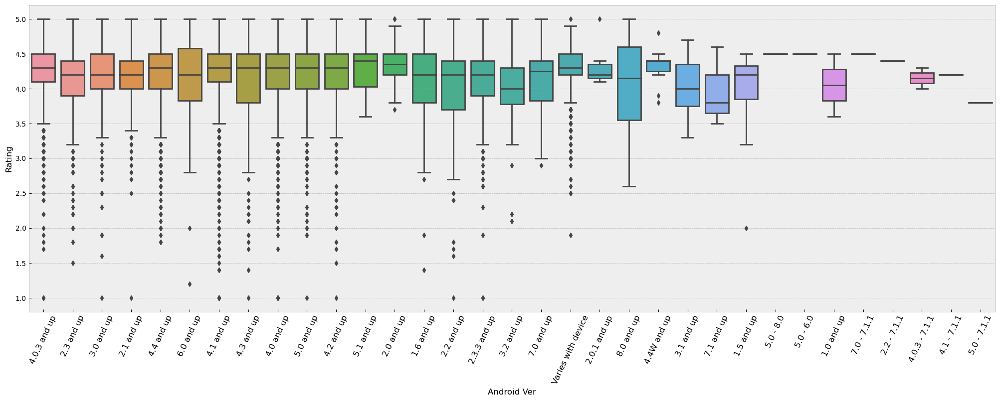

In [94]:
plt.figure(figsize=(25,8))
sns.boxplot(y='Rating',x='Android Ver',data = data.sort_values('Rating',ascending=False))
plt.xticks(rotation=65)
plt.xticks(fontsize=12)


### Defining violin, box and joint plot & kde_plot functions

In [95]:

def violin_and_show(col):
    title = "Violin Plot of {} by Type".format(col)
    fig = px.violin(data, y=col, x="Type", color="Type",
                    box=True, template='presentation')
    fig.update_layout(title=title)
    fig.show()
    image_filename = f"{title}.png"
    fig.write_image(image_filename)
    img = Image(image_filename)
    display(img)
    

def box_and_show(col):
    title = "Box Plot of {} by Type".format(col)
    box = px.box(data, y=col, x='Type', color='Type', notched=True, 
             points='all', template='presentation')
    box.update_layout(title=title ,yaxis=dict(type='log'))
    box.show()
    image_filename = f"{title}.png"
    box.write_image(image_filename)
    img = Image(image_filename)
    display(img)


def jointplot(col1, col2):
    sns.set(style="whitegrid", context="notebook")
    palette = ["#1e90ff" , "#ff8f00"]
    grid = sns.jointplot(data=data, x=col1, y=col2
                         , kind="scatter", hue="Type"
                         , height=6, palette=palette)


def kde_plot(feature):
    sns.set(style="whitegrid", context="notebook")
    palette = ["#1e90ff" , "#ff8f00"]
    grid = sns.FacetGrid(data, hue="Type", aspect=2, palette=palette)
    grid.map(sns.kdeplot, feature)
    grid.add_legend()
    x_min = data[feature].min()
    x_max = data[feature].max()
    grid.set(xlim=(x_min, x_max))



* kde_plot Analysis

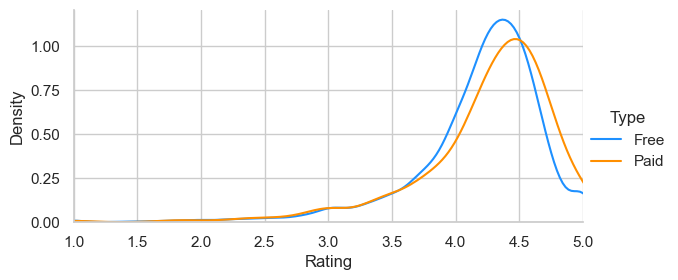

In [96]:
kde_plot('Rating')

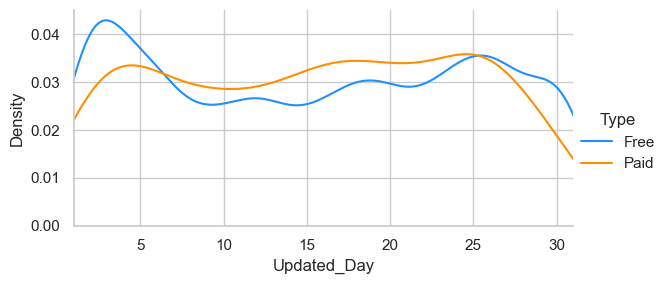

In [97]:
kde_plot('Updated_Day')

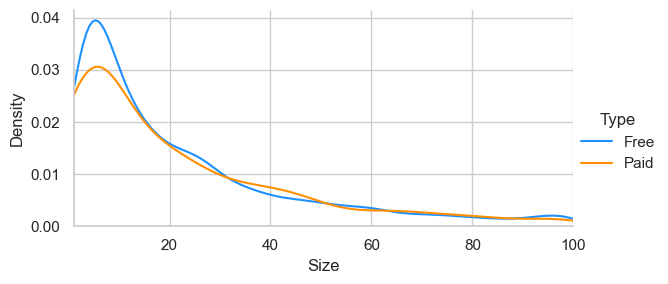

In [98]:
kde_plot('Size')

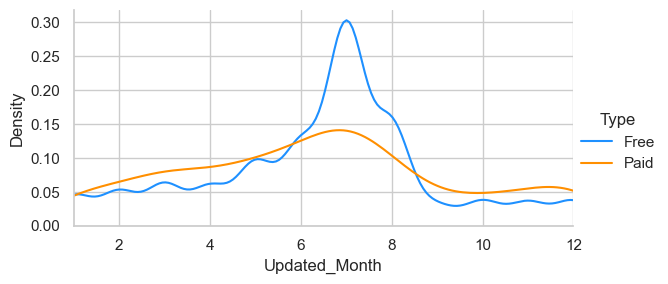

In [99]:
kde_plot('Updated_Month')

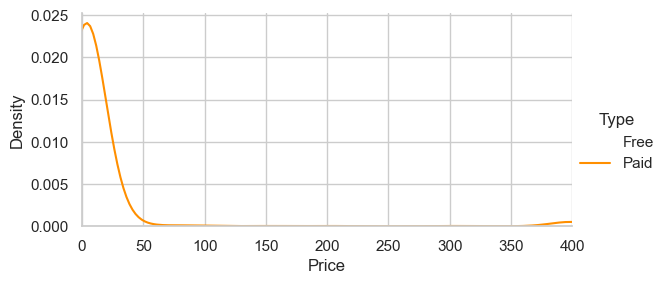

In [100]:
kde_plot('Price')

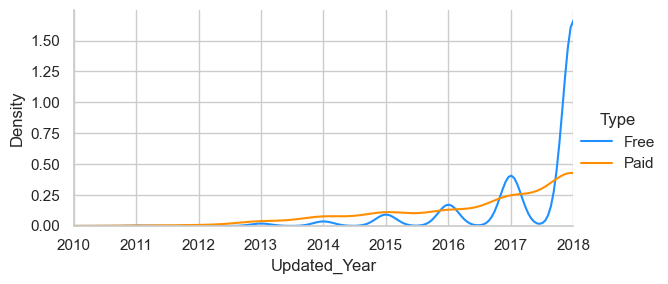

In [101]:
kde_plot('Updated_Year')

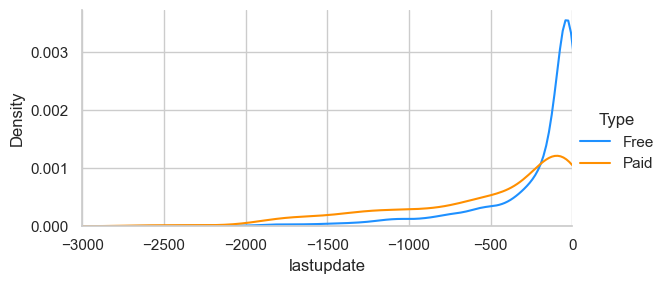

In [102]:
kde_plot('lastupdate')

* Joint plot Analysis

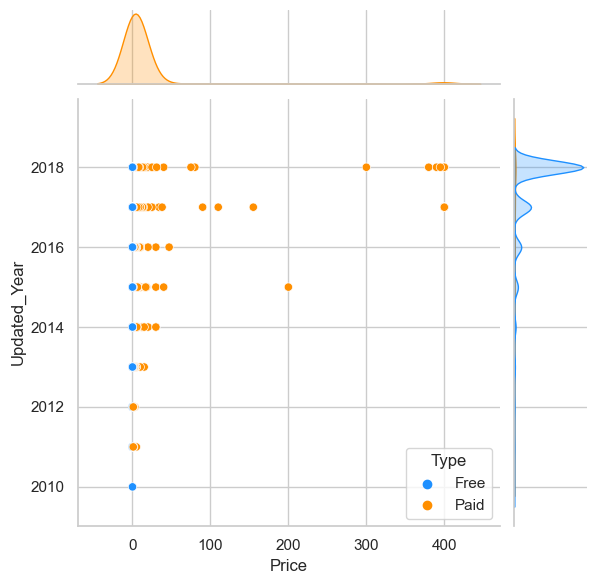

In [103]:
jointplot('Price', 'Updated_Year')

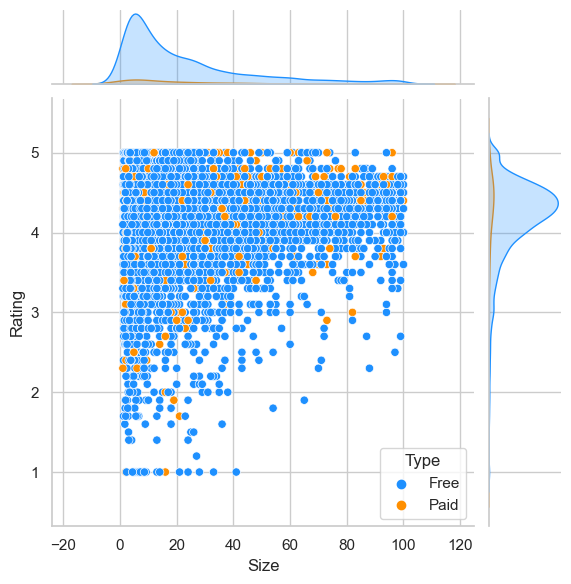

In [104]:
jointplot('Size', 'Rating')

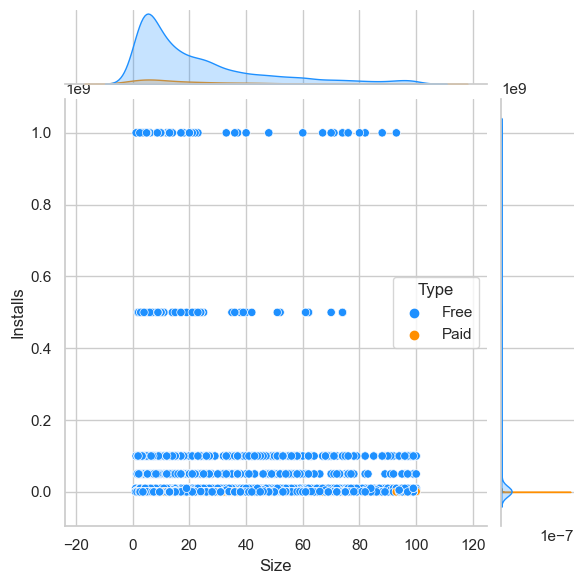

In [105]:
jointplot('Size', 'Installs')

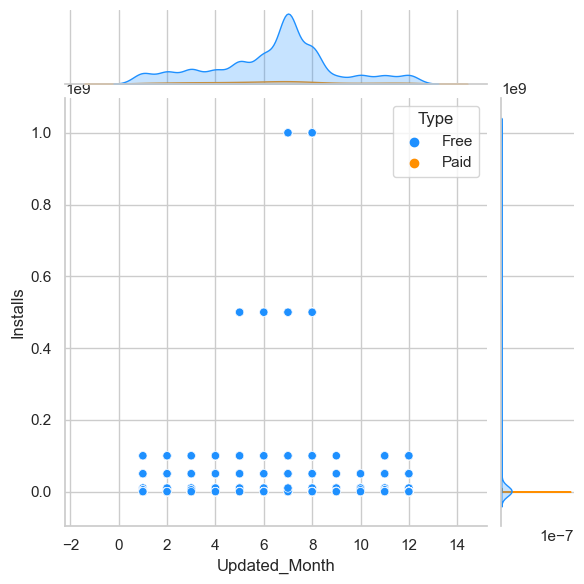

In [106]:
jointplot('Updated_Month', 'Installs')

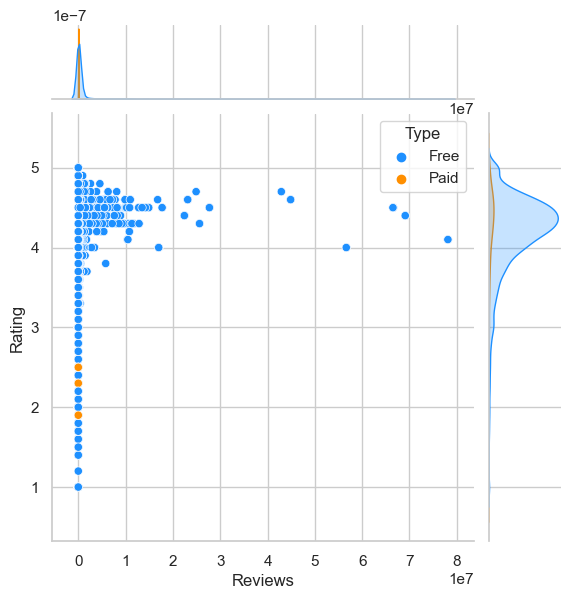

In [107]:
jointplot('Reviews', 'Rating')

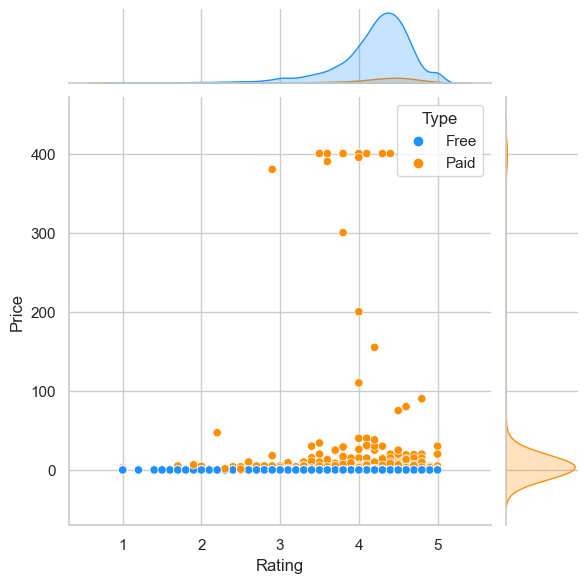

In [108]:
jointplot('Rating', 'Price')

 * Violin plot analysis

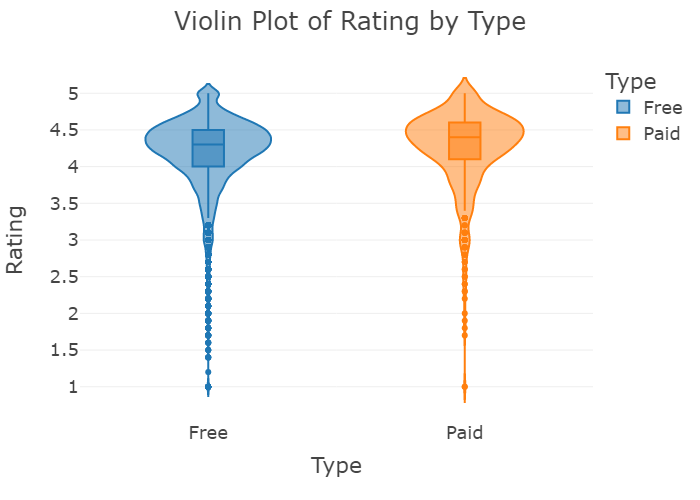

In [109]:
violin_and_show('Rating')

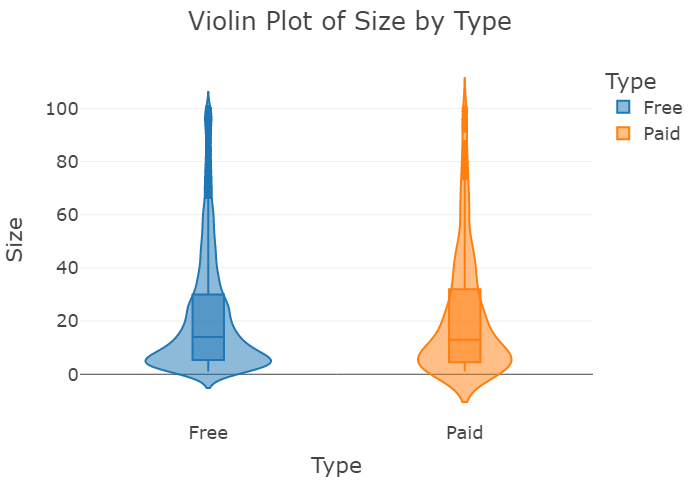

In [110]:
violin_and_show('Size')

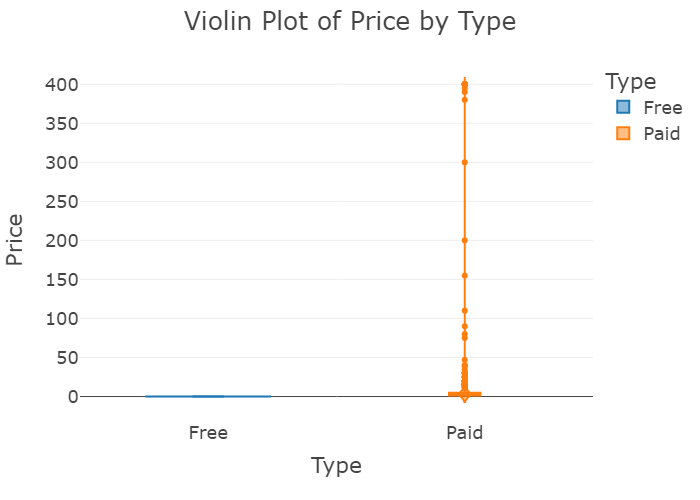

In [111]:
violin_and_show('Price')

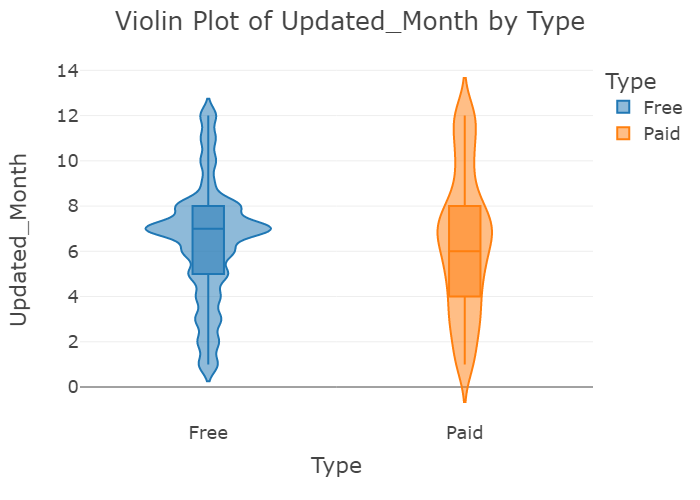

In [112]:
violin_and_show('Updated_Month')

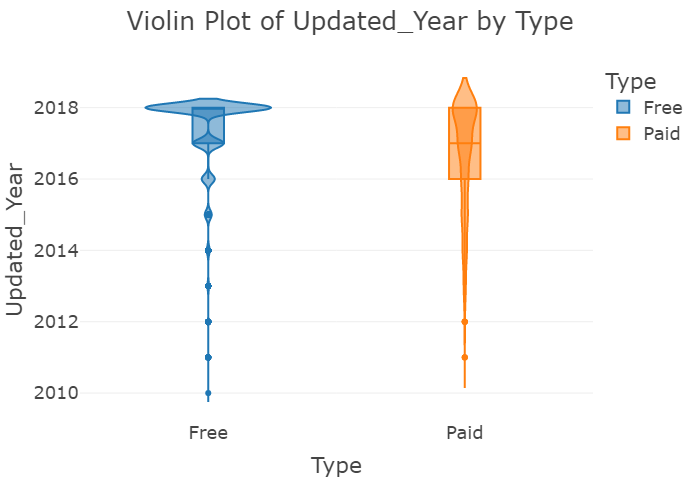

In [113]:
violin_and_show('Updated_Year')

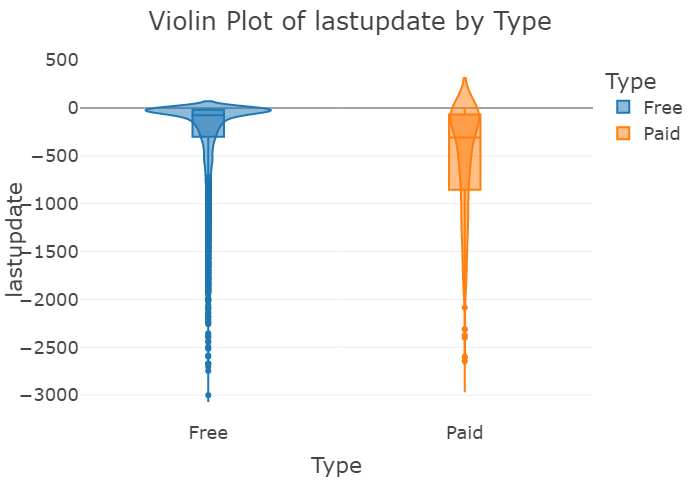

In [114]:
violin_and_show("lastupdate")

* Box plot analysis

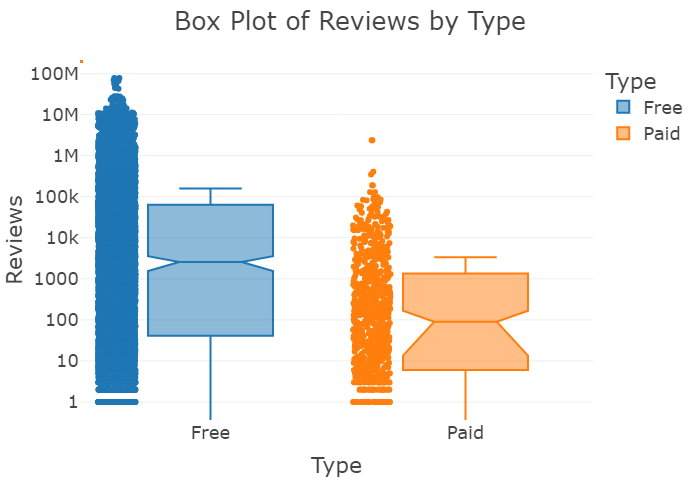

In [115]:
box_and_show('Reviews')

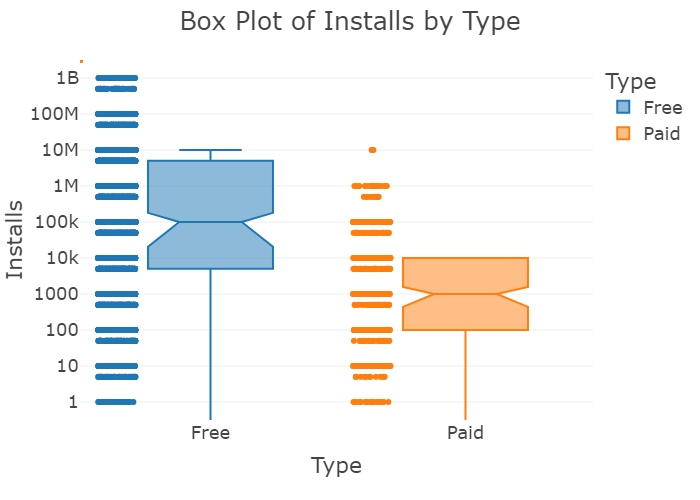

In [116]:
box_and_show('Installs')

Text(0.5, 1.0, 'Time series plot of Last Updates')

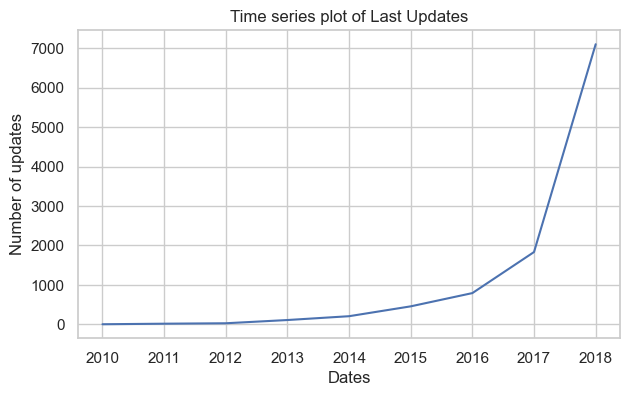

In [117]:
freq= pd.Series()
freq=data['Updated_Year'].value_counts()
freq.plot()
plt.xlabel("Dates")
plt.ylabel("Number of updates")
plt.title("Time series plot of Last Updates")

# Check Co-relation


In [118]:
corelation = pd.DataFrame({'corelation' : data.corr()["Rating"].abs().sort_values(ascending=False)[1:]})
corelation

,corelation
lastupdate,0.128688
Updated_Year,0.124528
Reviews,0.062387
Size,0.059045
Installs,0.048016
Price,0.023739
Updated_Month,0.010349
Updated_Day,0.007696


In [119]:
plt.style.use('ggplot')

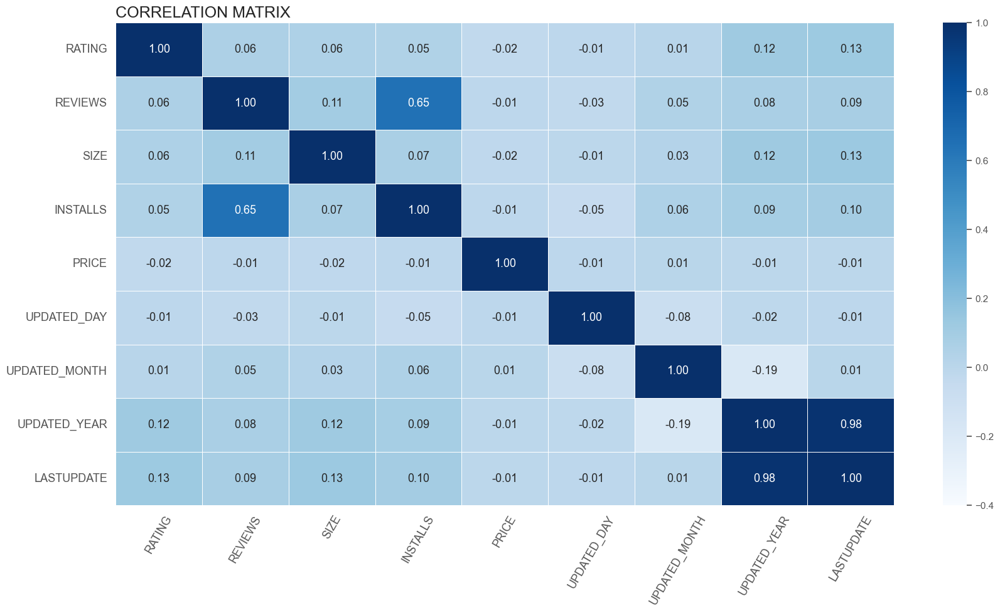

In [120]:
corelation = data.corr()

fig, ax = plt.subplots(figsize=(20,10))


sns.heatmap(data=corelation, 
            annot=True, annot_kws={"fontsize":13}, fmt=".2f", 
            cmap= "Blues",
            vmin=-0.4, vmax=1,
            linecolor='white', linewidths=0.5);

yticks = [i.upper() for i in corelation.index]
xticks = [i.upper() for i in corelation.columns]

ax.set_yticklabels(yticks, rotation=0, fontsize=13);
ax.set_xticklabels(xticks, rotation=60, fontsize=13);
title = 'CORRELATION MATRIX'
ax.set_title(title, loc='left', fontsize=18);


In [121]:
# Scale and Encoding

In [122]:
data_clean.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Current Ver', 'Android Ver',
       'Updated_Day', 'Updated_Month', 'Updated_Year', 'lastupdate'],
      dtype='object')

In [123]:
data_clean['Type'] = data_clean['Type'].map({'Free': 0, 'Paid': 1})


In [124]:
data_clean['Type'].unique()

array([0, 1], dtype=int64)

In [125]:
content_rating_counts = data_clean['Content Rating'].value_counts()
data_clean['ContentRating_C'] = data_clean['Content Rating'].map(content_rating_counts)

In [126]:
genres_frequencies = data_clean['Genres'].value_counts(normalize=True)
data_clean['Genres_F'] = data_clean['Genres'].map(genres_frequencies)

In [127]:
data_clean = pd.get_dummies(data_clean, columns=['Category'])

In [128]:
data_clean.columns

Index(['App', 'Rating', 'Reviews', 'Size', 'Installs', 'Type', 'Price',
       'Content Rating', 'Genres', 'Current Ver', 'Android Ver', 'Updated_Day',
       'Updated_Month', 'Updated_Year', 'lastupdate', 'ContentRating_C',
       'Genres_F', 'Category_ART_AND_DESIGN', 'Category_AUTO_AND_VEHICLES',
       'Category_BEAUTY', 'Category_BOOKS_AND_REFERENCE', 'Category_BUSINESS',
       'Category_COMICS', 'Category_COMMUNICATION', 'Category_DATING',
       'Category_EDUCATION', 'Category_ENTERTAINMENT', 'Category_EVENTS',
       'Category_FAMILY', 'Category_FINANCE', 'Category_FOOD_AND_DRINK',
       'Category_GAME', 'Category_HEALTH_AND_FITNESS',
       'Category_HOUSE_AND_HOME', 'Category_LIBRARIES_AND_DEMO',
       'Category_LIFESTYLE', 'Category_MAPS_AND_NAVIGATION',
       'Category_MEDICAL', 'Category_NEWS_AND_MAGAZINES', 'Category_PARENTING',
       'Category_PERSONALIZATION', 'Category_PHOTOGRAPHY',
       'Category_PRODUCTIVITY', 'Category_SHOPPING', 'Category_SOCIAL',
       'Ca

In [129]:
data_clean.drop(columns = ['App', 'Content Rating', 'Genres', 'Current Ver', 'Android Ver'], inplace=True)

In [130]:
plt.style.use('bmh')

- Total number of ratings: 10533
- Mean of distribution of rating : 4.192438051837083
- Standard deviation: 0.5042480878829111


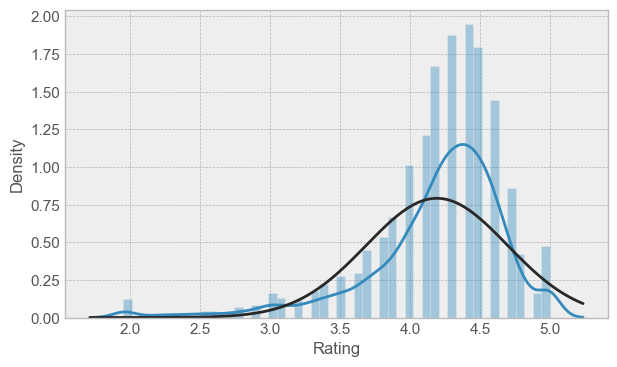

In [131]:
from scipy.stats import norm
sns.distplot(data_clean['Rating'],fit=norm)
print('- Total number of ratings:', len(data_clean['Rating']))
print('- Mean of distribution of rating :', np.mean(data_clean['Rating']))
print('- Standard deviation:', np.std(data_clean['Rating']))

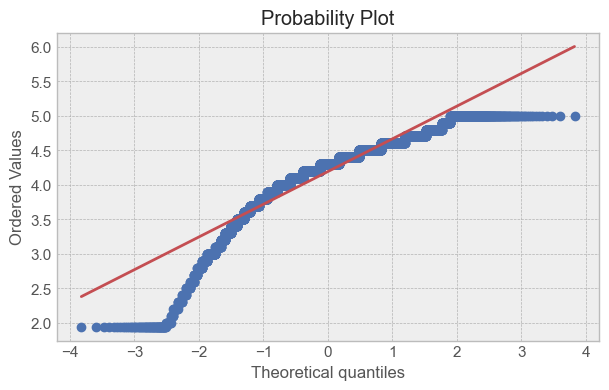

In [132]:
from scipy import stats
fig = plt.figure()
prob = stats.probplot(data_clean['Rating'], plot=plt)

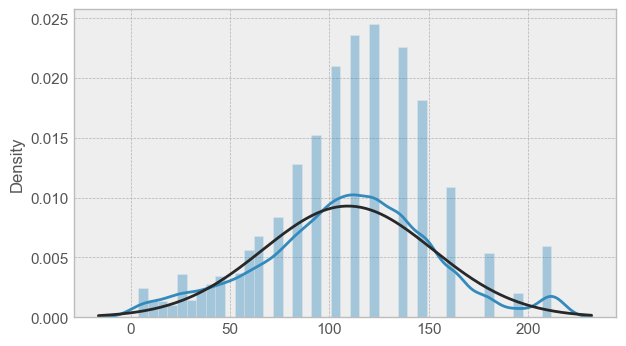

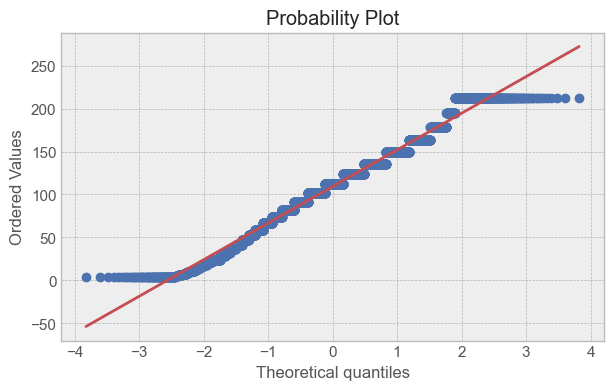

In [133]:
from scipy.stats import boxcox
from scipy.special import inv_boxcox
bcx_target, lam =boxcox(data_clean['Rating'])
sns.distplot(bcx_target,fit=norm);
fig = plt.figure()
prob = stats.probplot(bcx_target, plot=plt)

# Separate dependent & independent features

In [134]:
import sklearn
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

kf = KFold(n_splits=10)


X = data_clean.drop(labels = ['Rating'],axis = 1)
y = bcx_target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state= 42)

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



# Model Prediction:

In [135]:
from sklearn.model_selection import KFold, RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from scipy.special import inv_boxcox
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

# Khởi tạo KFold
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Khởi tạo các mô hình
linear = LinearRegression()
knn = KNeighborsRegressor()
rf = RandomForestRegressor()
gb = GradientBoostingRegressor()
xgb = XGBRegressor()

# Danh sách các mô hình để tiện xử lý
models = [
    ("Linear Regression", linear),
    ("KNeighbors", knn),
    ("RandomForest", rf),
    ("GradientBoosting", gb),
    ("XGBoost", xgb)
]


# Định nghĩa các param_grid tương ứng với từng mô hình
param_dist_knn = {
    'n_neighbors': range(2, 50),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

param_dist_rf = {
    'n_estimators': range(10, 500, 30),
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20]
}

param_dist_gb = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

param_dist_xgb = {
    'n_estimators': range(10, 500, 30),
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': range(2, 10, 1)
}



results = []
best_estimators = {}

# Duyệt qua các mô hình để thực hiện hyperparameter tuning và tính MSE
for model_name, model in models:
    mse_scores = []  # Danh sách lưu MSE từ các fold
    if "Linear Regression" in model_name:
        # Không cần hyperparameter tuning cho Linear Regression
        for train_index, test_index in kf.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Huấn luyện mô hình
            model.fit(X_train, y_train)

            # Dự đoán trên tập kiểm tra
            y_test_prediction = model.predict(X_test)

            # Tính MSE và chuyển đổi trở lại dạng ban đầu
            mse = mean_squared_error(inv_boxcox(y_test, lam), inv_boxcox(y_test_prediction, lam))
            mse_scores.append(mse)

    else:
        param_dist = None
        if "KNeighbors" in model_name:
            param_dist = param_dist_knn
        elif "RandomForest" in model_name:
            param_dist = param_dist_rf
        elif "GradientBoosting" in model_name:
            param_dist = param_dist_gb
        elif "XGBoost" in model_name:
            param_dist = param_dist_xgb

        random_search = RandomizedSearchCV(model, param_dist, cv=kf, n_iter=10, scoring='neg_mean_squared_error', random_state=42)
        random_search.fit(X, y)
        best_model = random_search.best_estimator_
        best_estimators[model_name] = best_model

        for train_index, test_index in kf.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Huấn luyện mô hình
            best_model.fit(X_train, y_train)

            # Dự đoán trên tập kiểm tra
            y_test_prediction = best_model.predict(X_test)

            # Tính MSE và chuyển đổi trở lại dạng ban đầu
            mse = mean_squared_error(inv_boxcox(y_test, lam), inv_boxcox(y_test_prediction, lam))
            mse_scores.append(mse)

    # Lưu kết quả trung bình và độ lệch chuẩn của các fold vào map
    average_mse = np.mean(mse_scores)
    std_deviation = np.std(mse_scores)
    
    results.append({
        'model_name': model_name,
        'average_mse': average_mse,
        'std_deviation': std_deviation,
        'mse_scores': mse_scores
    })
    
    
    print(f"{model_name}: MSE = {average_mse:.2f} (+/- {std_deviation:.2f})")


Linear Regression: MSE = 0.25 (+/- 0.02)
KNeighbors: MSE = 0.23 (+/- 0.02)
RandomForest: MSE = 0.22 (+/- 0.02)
GradientBoosting: MSE = 0.22 (+/- 0.02)
XGBoost: MSE = 0.22 (+/- 0.02)


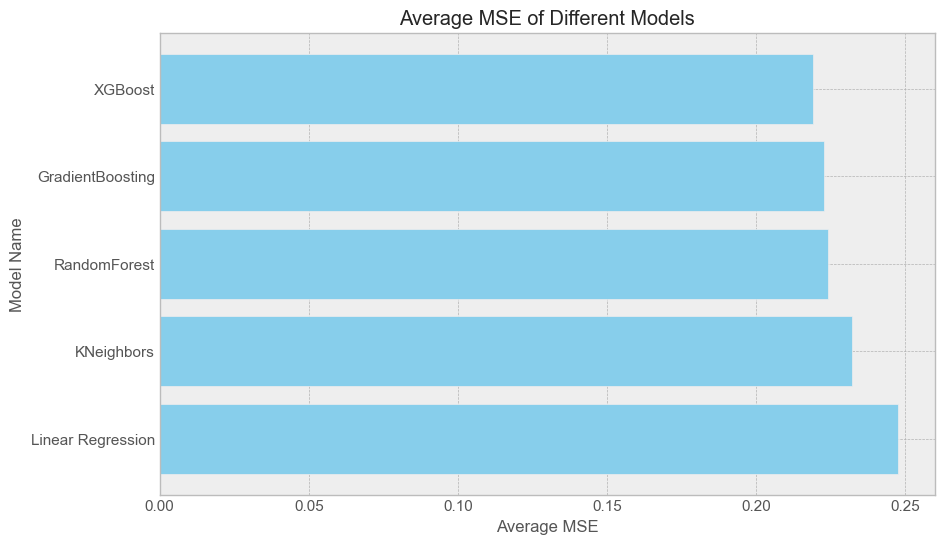

In [136]:
model_names = [result['model_name'] for result in results]
average_mse_values = [result['average_mse'] for result in results]

plt.figure(figsize=(10, 6))
plt.barh(model_names, average_mse_values, color='skyblue')
plt.xlabel('Average MSE')
plt.ylabel('Model Name')
plt.title('Average MSE of Different Models')
plt.show()

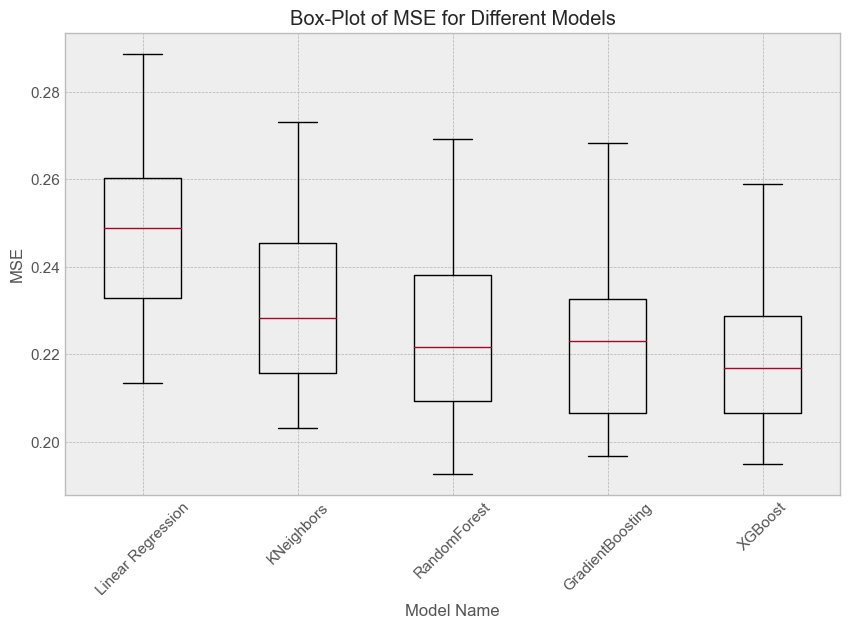

In [137]:
mse_values_list = [result['mse_scores'] for result in results]

plt.figure(figsize=(10, 6))
plt.boxplot(mse_values_list, labels=model_names)
plt.xlabel('Model Name')
plt.ylabel('MSE')
plt.title('Box-Plot of MSE for Different Models')
plt.xticks(rotation=45)
plt.show()

In [138]:
best_knn_estimator = best_estimators["KNeighbors"]
best_rf_estimator = best_estimators["RandomForest"]
best_gb_estimator = best_estimators["GradientBoosting"]
best_xgb_estimator = best_estimators["XGBoost"]

In [139]:
def plot_feature_importance(X, model):
    Feat_impt = {}
    for col, feat in zip(X.columns, model.feature_importances_):
        Feat_impt[col] = feat

    Feat_impt_df = pd.DataFrame.from_dict(Feat_impt, orient='index')
    Feat_impt_df.sort_values(by=0, inplace=True)
    Feat_impt_df.rename(index=str, columns={0: 'Pct'}, inplace=True)

    plt.figure(figsize=(14, 10))
    Feat_impt_df.plot(kind='barh', figsize=(14, 10), legend=False)
    plt.show()


<Figure size 1400x1000 with 0 Axes>

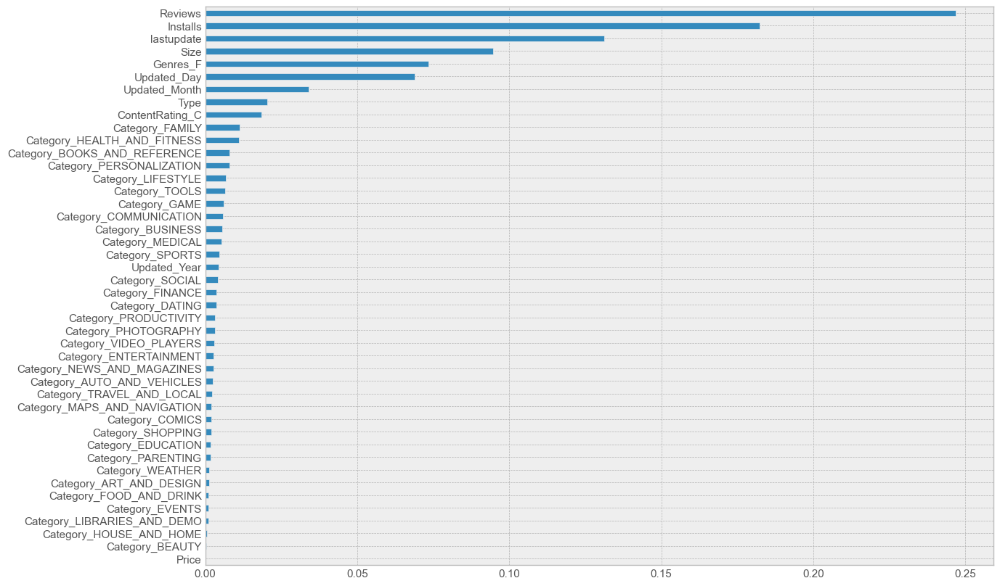

In [140]:
plot_feature_importance(X, best_rf_estimator)

<Figure size 1400x1000 with 0 Axes>

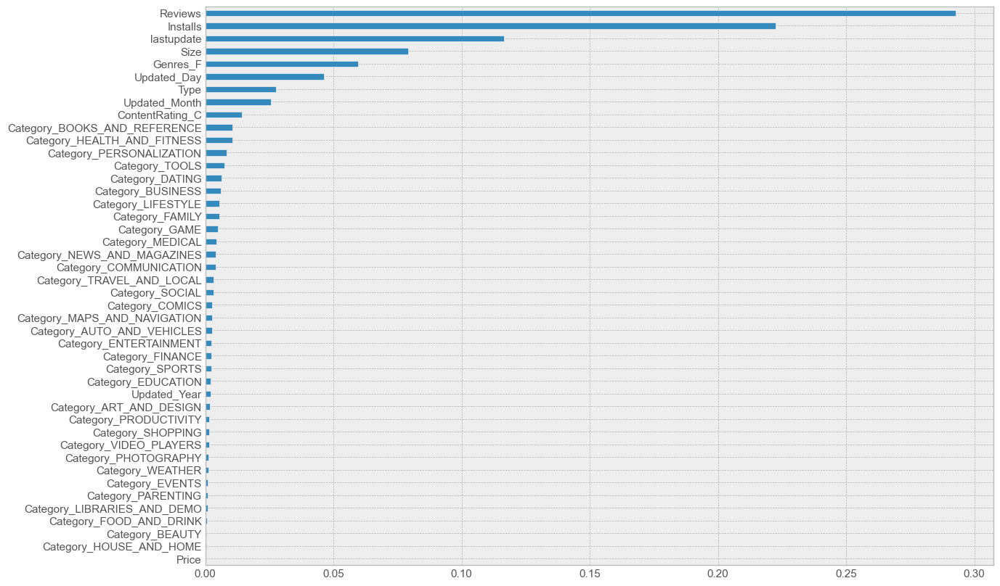

In [141]:
plot_feature_importance(X, best_gb_estimator)

<Figure size 1400x1000 with 0 Axes>

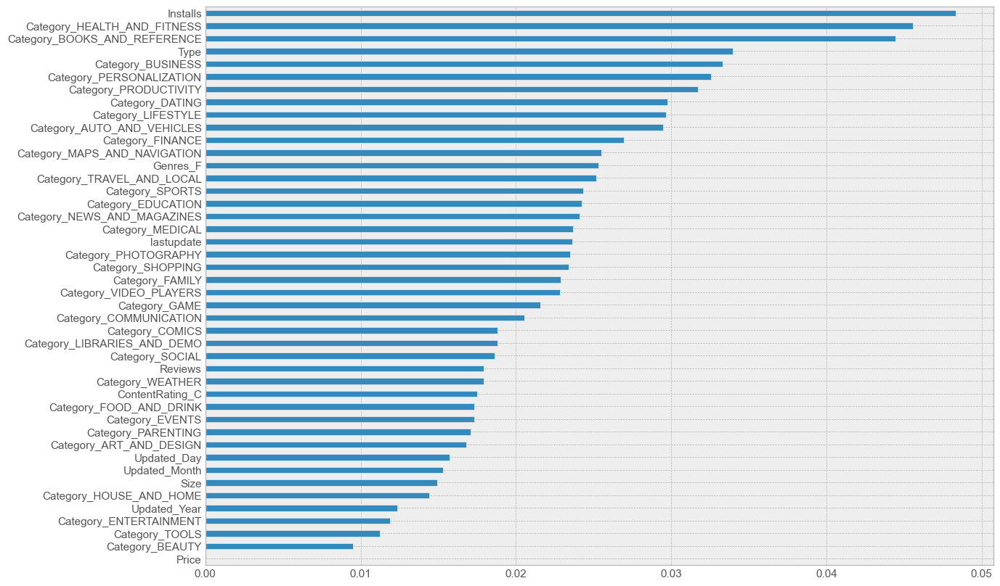

In [142]:
plot_feature_importance(X, best_xgb_estimator)

In [143]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.special import inv_boxcox

def plot_regression_results(model, model_name):
    model.fit(X_train, y_train)
    y_predict = model.predict(X_test)
    
    plt.figure(figsize=(10, 5))
    sns.regplot(x=inv_boxcox(y_predict, lam), y=inv_boxcox(y_test, lam), color='teal', marker='x')
    plt.title(f'{model_name} Regression model')
    plt.xlabel('Predicted Ratings')
    plt.ylabel('Actual Ratings')
    plt.show()


def cal_stat(model):
    y_predict = model.predict(X)
    results = inv_boxcox(y_predict, lam)
    mean_population = inv_boxcox(y, lam).mean()
    mean_predictions = results.mean()
    std_predictions = results.std()
    print(f'Actual mean of population: {mean_population:.2f}')
    print(f'Mean of predictions: {mean_predictions:.2f}')
    print(f'Standard deviation of predictions: {std_predictions:.2f}')




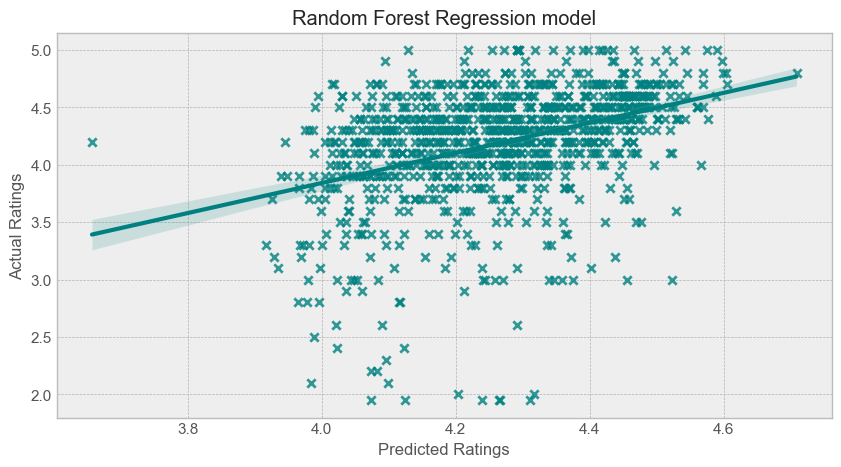

In [144]:
plot_regression_results(best_rf_estimator, 'Random Forest')

In [145]:
cal_stat(best_rf_estimator)

Actual mean of population: 4.19
Mean of predictions: 4.27
Standard deviation of predictions: 0.16


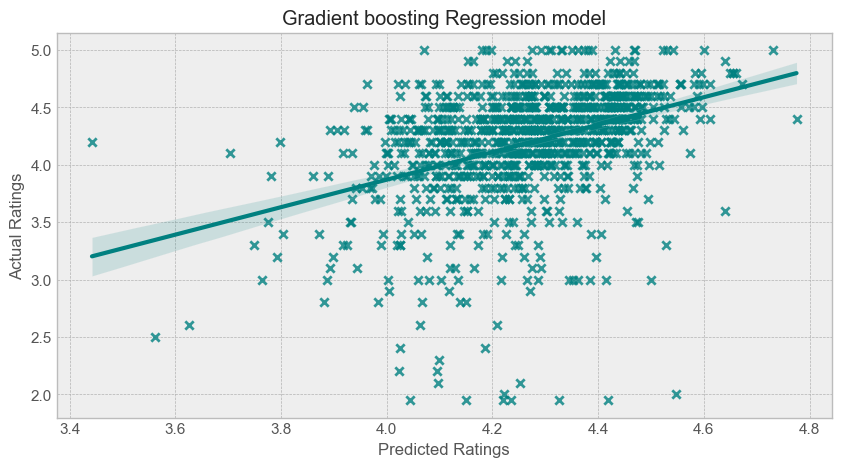

In [146]:
plot_regression_results(best_gb_estimator, 'Gradient boosting')

In [147]:
cal_stat(best_gb_estimator)

Actual mean of population: 4.19
Mean of predictions: 4.27
Standard deviation of predictions: 0.17


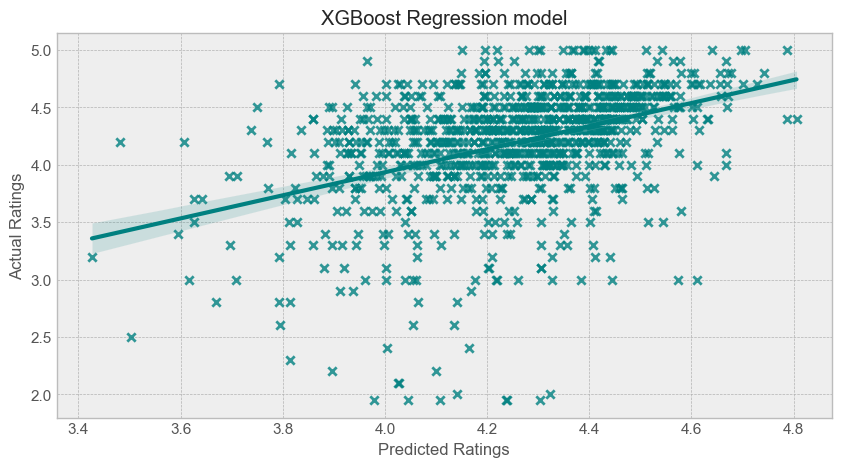

In [148]:
plot_regression_results(best_xgb_estimator, 'XGBoost')

In [149]:
cal_stat(best_xgb_estimator)

Actual mean of population: 4.19
Mean of predictions: 4.25
Standard deviation of predictions: 0.26
